In [1]:
import pandas as pd
from sklearn.datasets import make_classification #allows us to generate synthetic datasets
from sklearn.linear_model import LogisticRegression #allows LogisticRegression classifier model objects to be created
from sklearn.model_selection import train_test_split
import missingno as msno
import matplotlib.pyplot as plt
import numpy as np
import math
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from mlxtend.plotting import plot_decision_regions
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
#importing tensorflow and keras
import tensorflow as tf
from tensorflow import keras
from imblearn.over_sampling import SMOTE 
from collections import Counter
from sklearn import tree
import sklearn.ensemble
import shap
import graphviz
from dtreeviz.trees import dtreeviz
from sklearn.inspection import permutation_importance

import eli5
from eli5 import show_weights
from eli5.sklearn import PermutationImportance
from IPython.display import display
from sklearn.metrics import fbeta_score, make_scorer

In [2]:
df = pd.read_csv('Myocardial infarction complications Database.csv')


In [3]:
#print the head to see data
df.head()

,ID,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,1,77.0,1,2.0,1.0,1.0,2.0,NaN,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,2,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,3,52.0,1,0.0,0.0,0.0,2.0,NaN,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,4,68.0,0,0.0,0.0,0.0,2.0,NaN,2.0,0.0,...,0,0,0,0,0,0,1,0,0,0
4,5,60.0,1,0.0,0.0,0.0,2.0,NaN,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(1700, 124)

In [5]:
#the data will be all columns this time
df_X = df.iloc[:,2:123]

In [6]:
df_X.columns

Index(['SEX', 'INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'IBS_NASL',
       'GB', 'SIM_GIPERT', 'DLIT_AG', 'ZSN_A',
       ...
       'PREDS_TAH', 'JELUD_TAH', 'FIBR_JELUD', 'A_V_BLOK', 'OTEK_LANC',
       'RAZRIV', 'DRESSLER', 'ZSN', 'REC_IM', 'P_IM_STEN'],
      dtype='object', length=121)

In [7]:
pd.set_option('display.max_rows', 500)
df_X.isnull().sum()

SEX                 0
INF_ANAM            4
STENOK_AN         106
FK_STENOK          73
IBS_POST           51
IBS_NASL         1628
GB                  9
SIM_GIPERT          8
DLIT_AG           248
ZSN_A              54
nr_11              21
nr_01              21
nr_02              21
nr_03              21
nr_04              21
nr_07              21
nr_08              21
np_01              18
np_04              18
np_05              18
np_07              18
np_08              18
np_09              18
np_10              18
endocr_01          11
endocr_02          10
endocr_03          10
zab_leg_01          7
zab_leg_02          7
zab_leg_03          7
zab_leg_04          7
zab_leg_06          7
S_AD_KBRIG       1076
D_AD_KBRIG       1076
S_AD_ORIT         267
D_AD_ORIT         267
O_L_POST           12
K_SH_POST          15
MP_TP_POST         14
SVT_POST           12
GT_POST            12
FIB_G_POST         12
ant_im             83
lat_im             80
inf_im             80
post_im   

In [8]:
#create a set with and without highly unpopulated columns
missing_data = []
#loop through colunmns
for col in df_X:
    #find columsn with more than 1 missing point
    if sum(pd.isnull(df_X[col])) > 200:
        #add columns to a list
        missing_data.append(col)
        #remove the whole list form the data
        df_X_removed = df_X.drop(columns = missing_data)
    #do nothing
    else:
        pass
    
df_X_removed.shape

(1700, 104)

In [9]:
# put a constant value into the data to replace all the remaining null values 
df_X_removed = df_X_removed.fillna(-1, inplace=False)
df_X_full = df_X.fillna(-1, inplace=False)
df = df.fillna(-1, inplace=False)

In [10]:
df_X_removed

,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,GB,SIM_GIPERT,ZSN_A,nr_11,nr_01,...,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN
0,1,2.0,1.0,1.0,2.0,3.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,1,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0,0.0,0.0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
4,1,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,0,0.0,4.0,2.0,1.0,2.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,1,0,0,0,0
1696,0,0.0,6.0,2.0,1.0,2.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1697,1,3.0,6.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
1698,0,2.0,2.0,2.0,1.0,2.0,0.0,-1.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,0


In [11]:
df_X_full

,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,DLIT_AG,ZSN_A,...,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN
0,1,2.0,1.0,1.0,2.0,-1.0,3.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,1,0.0,0.0,0.0,2.0,-1.0,2.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0,0.0,0.0,0.0,2.0,-1.0,2.0,0.0,3.0,1.0,...,0,0,0,0,0,0,0,1,0,0
4,1,0.0,0.0,0.0,2.0,-1.0,3.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,0,0.0,4.0,2.0,1.0,-1.0,2.0,0.0,7.0,0.0,...,0,0,0,1,0,1,0,0,0,0
1696,0,0.0,6.0,2.0,1.0,-1.0,2.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1697,1,3.0,6.0,2.0,2.0,-1.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
1698,0,2.0,2.0,2.0,1.0,-1.0,2.0,0.0,7.0,-1.0,...,0,0,0,0,1,0,0,0,0,0


In [12]:
#zero means they survived - 1 is dead
#make all types of deaths count as deaths
df['LET_IS'] = np.where(df['LET_IS'] != 0, 1,0)
#check data distribution
print(df['LET_IS'].value_counts())
#what we are trying to find is if people died 
df_Y = df['LET_IS']
class_names = ['Alive','Dead']

0    1429
1     271
Name: LET_IS, dtype: int64


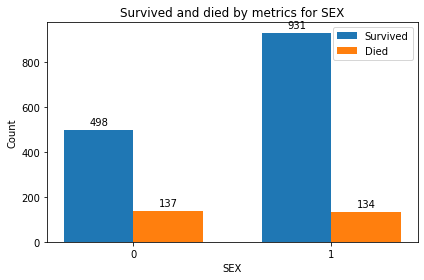

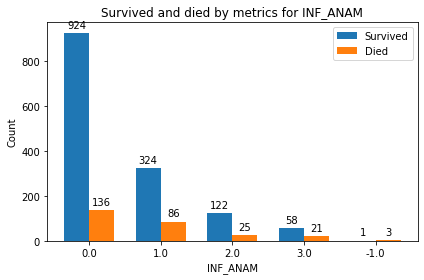

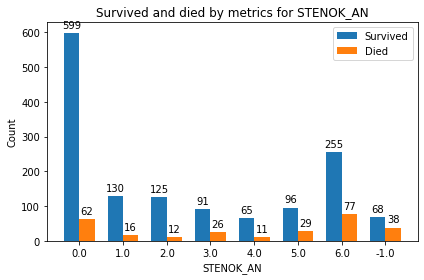

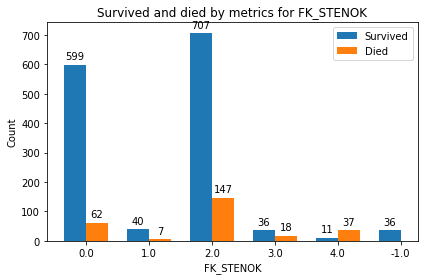

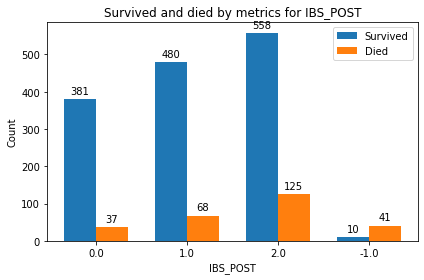

...

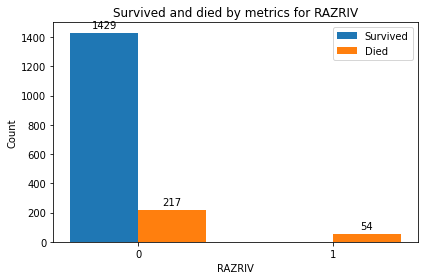

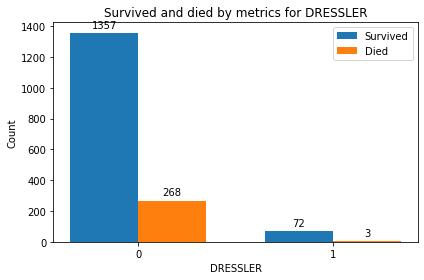

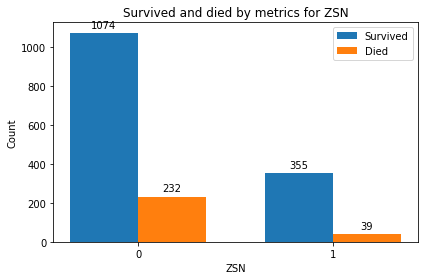

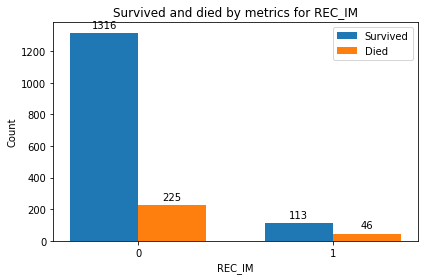

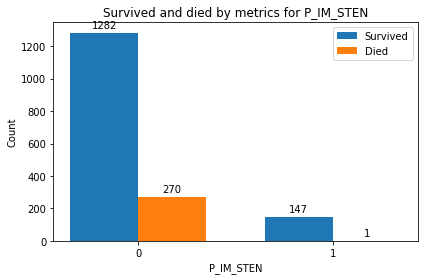

In [13]:
###display graphs of the data ### 

for col in df_X_full.columns:
    Survived = df.query('LET_IS == 0')[col]
    Died = df.query('LET_IS == 1')[col]
    labels_1 = np.sort(Died.unique())
    labels_2 = np.sort(Survived.unique())
    
    x1 = np.arange(len(labels_1))
    x2 = np.arange(len(labels_2))
    width = 0.35  # the width of the bars
    
    if labels_1[0] == -1:
        labels_1 = np.delete(labels_1, 0)
        labels_1 = np.append([labels_1], [-1])
    else:
        pass

    if labels_2[0] == -1:
            labels_2 = np.delete(labels_2, 0)
            labels_2 = np.append([labels_2], [-1])
    else:
        pass

    count_1 = []
    count_2 = []
    for value in labels_1:
        count_1.append(Died.value_counts()[value])
    for value in labels_2:
        count_2.append(Survived.value_counts()[value])

    fig, ax = plt.subplots()
    rects1 = ax.bar(x2-width/2, count_2, width, label='Survived')
    rects2 = ax.bar(x1+width/2, count_1, width, label='Died')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Count')
    ax.set_xlabel('{}'.format(col))
    ax.set_title('Survived and died by metrics for {}'.format(col))
    if len(labels_1)>len(labels_2):
        ax.set_xticks(x1, labels_1)
    else:
        ax.set_xticks(x2, labels_2)
    ax.legend()

    ax.bar_label(rects1, padding=3)
    ax.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

In [14]:
def evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred):
     #Accuracy
    clf_test_accuracy = accuracy_score(y_test, y_test_pred)
    clf_train_accuracy = accuracy_score(y_train, y_train_pred)
    print("Accuracy [Higher Better]: ")
    print("Training: "+str(clf_train_accuracy)+" -- Test: "+str(clf_test_accuracy))

    #Balanced Accuracy
    clf_test_balanced_accuracy = balanced_accuracy_score(y_test, y_test_pred)
    clf_train_balanced_accuracy = balanced_accuracy_score(y_train, y_train_pred)
    print("Balanced Accuracy [Higher Better]: ")
    print("Training: "+str(clf_train_balanced_accuracy)+" -- Test: "
          +str(clf_test_balanced_accuracy))

    #Precision
    clf_test_precision = precision_score(y_test, y_test_pred)
    clf_train_precision = precision_score(y_train, y_train_pred)
    print("Precision [Higher Better]: ")
    print("Training: "+str(clf_train_precision)+" -- Test: "+str(clf_test_precision))

    #Recall
    clf_test_recall = recall_score(y_test, y_test_pred)
    clf_train_recall = recall_score(y_train, y_train_pred)
    print("Recall [Higher Better]: ")
    print("Training: "+str(clf_train_recall)+" -- Test: "+str(clf_test_recall))

    #F1-measure
    clf_test_f1_score = f1_score(y_test, y_test_pred)
    clf_train_f1_score = f1_score(y_train, y_train_pred)
    print("F1-measure [Higher Better]: ")
    print("Training: "+str(clf_train_f1_score)+" -- Test: "+str(clf_test_f1_score))

    #Cohen's Kappa
    clf_test_cohen_kappa = cohen_kappa_score(y_test, y_test_pred)
    clf_train_cohen_kappa = cohen_kappa_score(y_train, y_train_pred)
    print("Cohen Kappa [Higher Better]: ")
    print("Training: "+str(clf_train_cohen_kappa)+" -- Test: "+str(clf_test_cohen_kappa))

    #Matthews Correlation Coefficient
    clf_test_matthews_corrcoef = matthews_corrcoef(y_test, y_test_pred)
    clf_train_matthews_corrcoef = matthews_corrcoef(y_train, y_train_pred)
    print("Matthews Correlation Coefficient (MCC) [Higher Better]: ")
    print("Training: "+str(clf_train_matthews_corrcoef)+" -- Test: "+str(clf_test_matthews_corrcoef))

    #ROC AUC
    clf_test_roc_auc = roc_auc_score(y_test, y_test_pred)
    clf_train_roc_auc = roc_auc_score(y_train, y_train_pred)
    print("ROC AUC [Higher Better]: ")
    print("Training: "+str(clf_train_roc_auc)+" -- Test: "+str(clf_test_roc_auc))

In [15]:
def display_tree(clf,X_train,S_name):
    plt.figure(figsize=(25,20))
    tree.plot_tree(clf, feature_names = X_train.columns, filled=True)
    plt.savefig("{}.png".format(S_name))            
    plt.show()
    
    dot_data = tree.export_graphviz(clf,
                     out_file=None,
                     feature_names = X_train.columns, 
                     class_names=None,
                     filled = True)
    graph = graphviz.Source(dot_data, format="png")
    graph.render("{}_graphivz".format(S_name))

In [16]:
def perm_importance(clf, X_test, y_test):
    r = permutation_importance(clf, X_test, y_test,
                                   n_repeats=30,
                                   random_state=42)
    feature_names = list(X_test.columns)
    for i in r.importances_mean.argsort()[::-1]:
        if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
            print(f"{feature_names[i]:<8}"
                    f"{r.importances_mean[i]:.3f}"
                    f" +/- {r.importances_std[i]:.3f}")
        else:
            pass
    #Obtain average permutation importance of each feature across 10 permutations (& st. dev.)
    perm = PermutationImportance(clf).fit(X_test, y_test, n_iter=10)
    #Show average permutation feature importance & st.dev. across 10 runs 
    plt.plot(eli5.show_weights(perm, feature_names=feature_names))

In [17]:
#load in the data in to train and test split
def decision_tree_classifier(X,Y,S_name):
#Perform train/test split:
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    # Create the DecisionTreeRegressor model object
    clf = DecisionTreeClassifier(max_depth=12)

    #Train regressor on training data:
    clf.fit(X_train, y_train)

    #Obtain model's predictions on test data:
    y_test_pred = clf.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = clf.predict(X_train)
    print("Evaluating decision tree model on training & test set.")

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
   
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("Decision Tree Confusion Matrix")
    plt.show()
    
    display_tree(clf,X_train,S_name)
    
    

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9875 -- Test: 0.9382352941176471
Balanced Accuracy [Higher Better]: 
Training: 0.9630321075400494 -- Test: 0.8611111111111112
Precision [Higher Better]: 
Training: 0.9950980392156863 -- Test: 0.8297872340425532
Recall [Higher Better]: 
Training: 0.9269406392694064 -- Test: 0.75
F1-measure [Higher Better]: 
Training: 0.9598108747044918 -- Test: 0.787878787878788
Cohen Kappa [Higher Better]: 
Training: 0.9524209347886929 -- Test: 0.7518420686778813
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9532613423544689 -- Test: 0.7531578790399597
ROC AUC [Higher Better]: 
Training: 0.9630321075400493 -- Test: 0.861111111111111


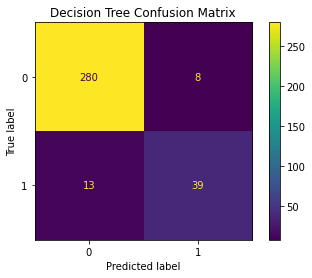

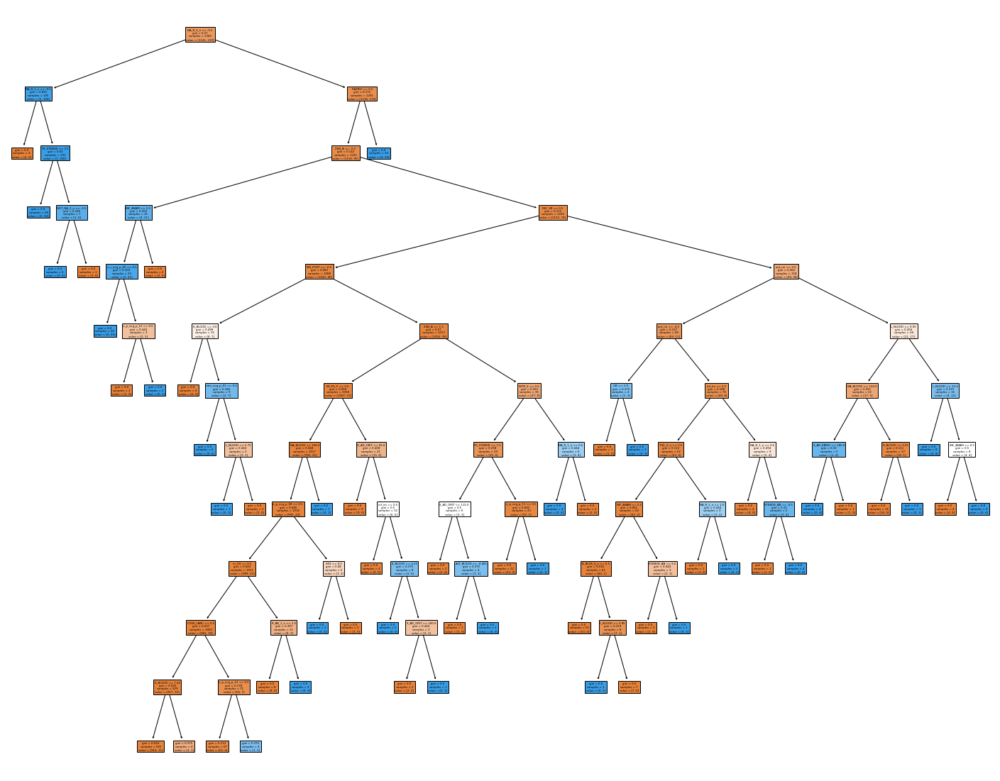

In [18]:
decision_tree_classifier(df_X_full,df_Y,"DTC_full_data")


Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9889705882352942 -- Test: 0.9411764705882353
Balanced Accuracy [Higher Better]: 
Training: 0.9657534246575342 -- Test: 0.8549679487179487
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.8636363636363636
Recall [Higher Better]: 
Training: 0.9315068493150684 -- Test: 0.7307692307692307
F1-measure [Higher Better]: 
Training: 0.9645390070921985 -- Test: 0.7916666666666666
Cohen Kappa [Higher Better]: 
Training: 0.9580184718723761 -- Test: 0.75769669327252
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9588638186539369 -- Test: 0.7612807679650181
ROC AUC [Higher Better]: 
Training: 0.9657534246575342 -- Test: 0.8549679487179488


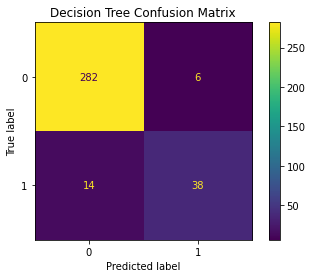

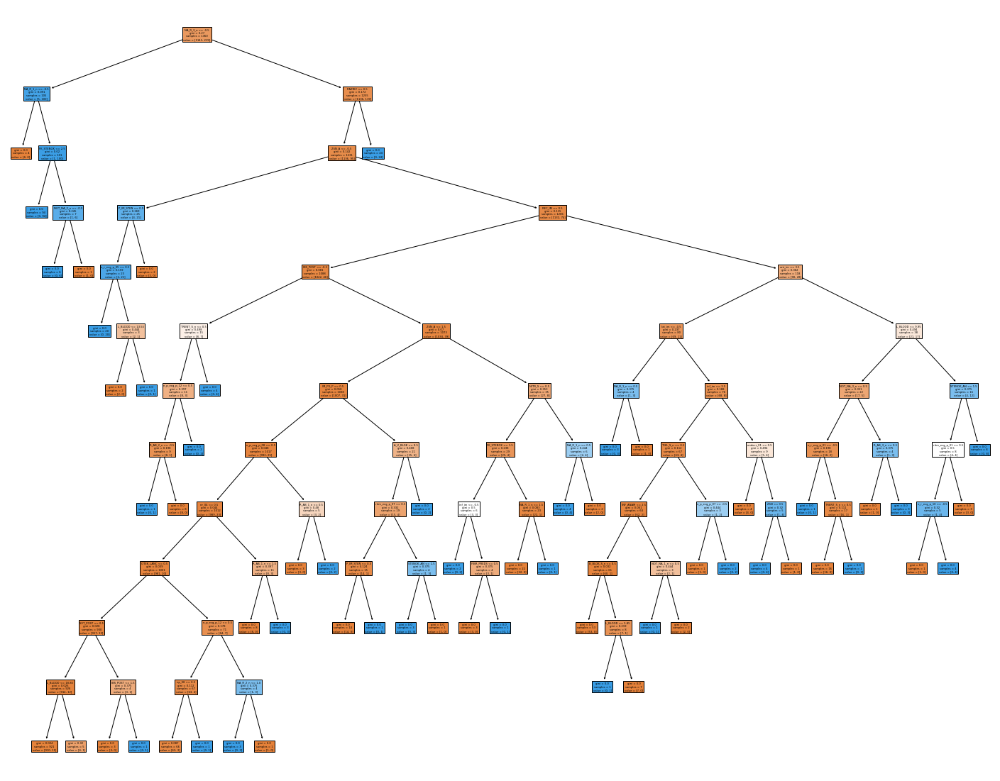

In [19]:
decision_tree_classifier(df_X_removed,df_Y,"DTC_removed_data")

In [20]:
sm = SMOTE(random_state=42)
df_X_removed_b, Y_balanced = sm.fit_resample(df_X_removed, df_Y)
print('Resampled dataset shape %s' % Counter(Y_balanced))

sm = SMOTE(random_state=42)
df_X_full_b, Y_balanced = sm.fit_resample(df_X_full, df_Y)
print('Resampled dataset shape %s' % Counter(Y_balanced))


Resampled dataset shape Counter({0: 1429, 1: 1429})
Resampled dataset shape Counter({0: 1429, 1: 1429})


Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.989938757655293 -- Test: 0.9562937062937062
Balanced Accuracy [Higher Better]: 
Training: 0.9899517392618901 -- Test: 0.9562548904538342
Precision [Higher Better]: 
Training: 0.9973404255319149 -- Test: 0.9608540925266904
Recall [Higher Better]: 
Training: 0.982532751091703 -- Test: 0.9507042253521126
F1-measure [Higher Better]: 
Training: 0.9898812142542895 -- Test: 0.9557522123893805
Cohen Kappa [Higher Better]: 
Training: 0.9798779773727706 -- Test: 0.912576724622796
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9799863699381317 -- Test: 0.9126269463773373
ROC AUC [Higher Better]: 
Training: 0.9899517392618901 -- Test: 0.956254890453834


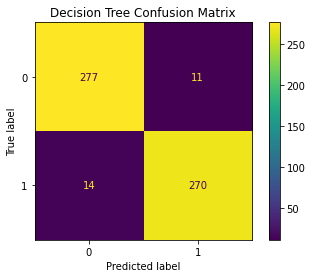

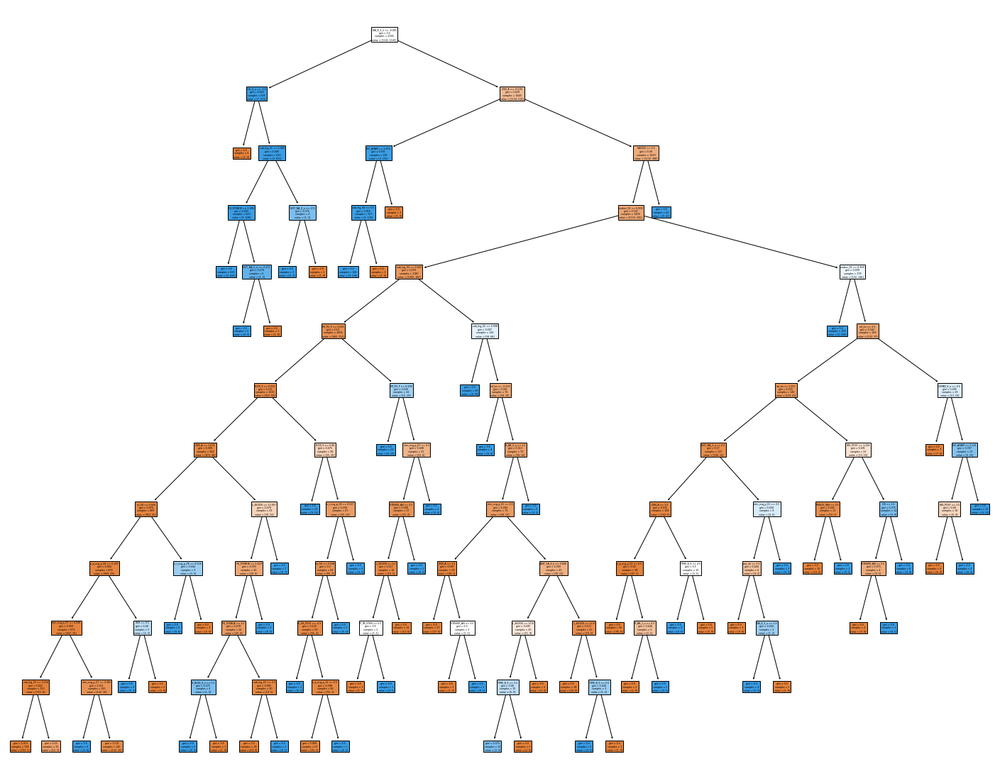

In [21]:
decision_tree_classifier(df_X_removed_b, Y_balanced,"DTC_removed_balanced")

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9881889763779528 -- Test: 0.9423076923076923
Balanced Accuracy [Higher Better]: 
Training: 0.9882065452430068 -- Test: 0.9422192879499218
Precision [Higher Better]: 
Training: 0.9982174688057041 -- Test: 0.9530685920577617
Recall [Higher Better]: 
Training: 0.9781659388646288 -- Test: 0.9295774647887324
F1-measure [Higher Better]: 
Training: 0.9880899867666519 -- Test: 0.9411764705882353
Cohen Kappa [Higher Better]: 
Training: 0.9763787121380859 -- Test: 0.8845899875272079
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9765764343678617 -- Test: 0.8848551807755288
ROC AUC [Higher Better]: 
Training: 0.9882065452430069 -- Test: 0.9422192879499218


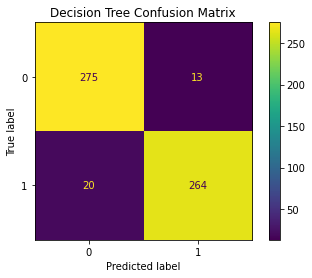

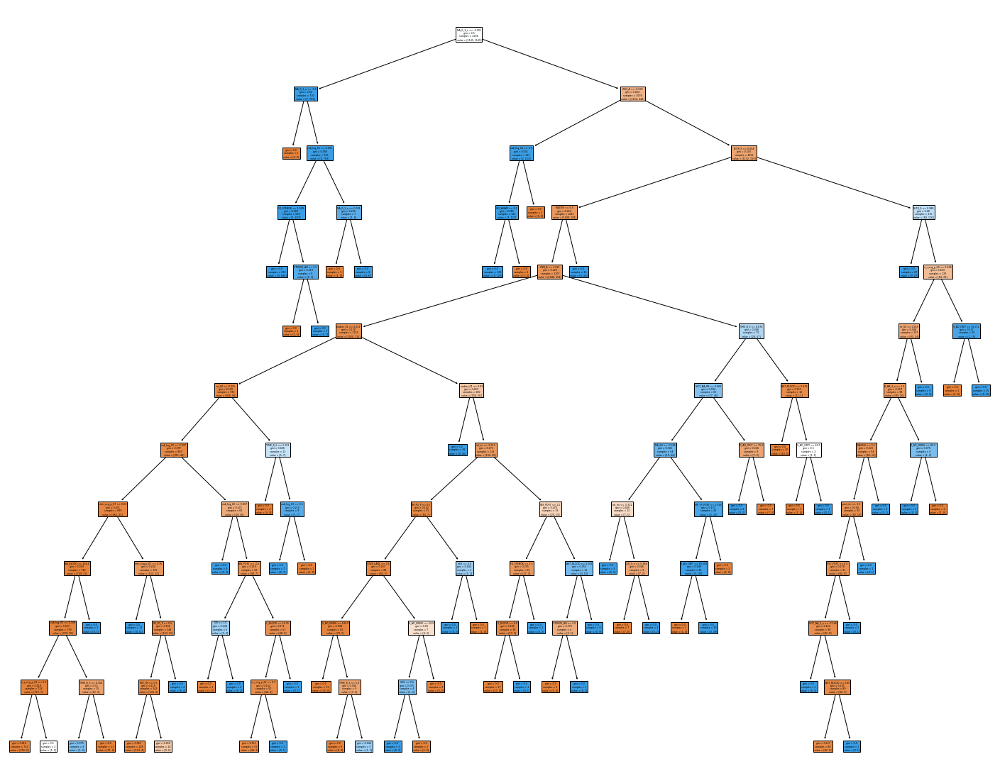

In [22]:
decision_tree_classifier(df_X_full_b, Y_balanced,"DTC_full_balanced")

In [23]:
def decision_tree_classifier_mixed(X,Y,S_name):
    
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    sm = SMOTE(random_state=42)
    X_train, y_train = sm.fit_resample(X_train, y_train)
    
    # Create the DecisionTreeRegressor model object
    clf = DecisionTreeClassifier(max_depth=7)

    #Train regressor on training data:
    clf.fit(X_train, y_train)

    #Obtain model's predictions on test data:
    y_test_pred = clf.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = clf.predict(X_train)
    print("Evaluating decision tree model on training & test set.")

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
   
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("Decision Tree Confusion Matrix")
    plt.show()
    
    display_tree(clf,X_train,S_name)
    
    #explainer = shap.Explainer(clf)
    #explainer = shap.explainers.Tree(clf)
    #shap_values = explainer.shap_values(X)
    #shap.summary_plot(shap_values, X_test.values, plot_type="bar", class_names = class_names, feature_names = X_test.columns)
    #shap.plots.bar(shap_values)
    
    plt.show()

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9478527607361963 -- Test: 0.9441176470588235
Balanced Accuracy [Higher Better]: 
Training: 0.9478527607361964 -- Test: 0.8330662393162394
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9459459459459459
Recall [Higher Better]: 
Training: 0.8957055214723927 -- Test: 0.6730769230769231
F1-measure [Higher Better]: 
Training: 0.9449838187702265 -- Test: 0.7865168539325843
Cohen Kappa [Higher Better]: 
Training: 0.8957055214723927 -- Test: 0.7554142056640921
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9006170724070864 -- Test: 0.769903596690581
ROC AUC [Higher Better]: 
Training: 0.9478527607361964 -- Test: 0.8330662393162394


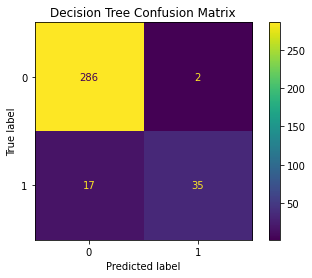

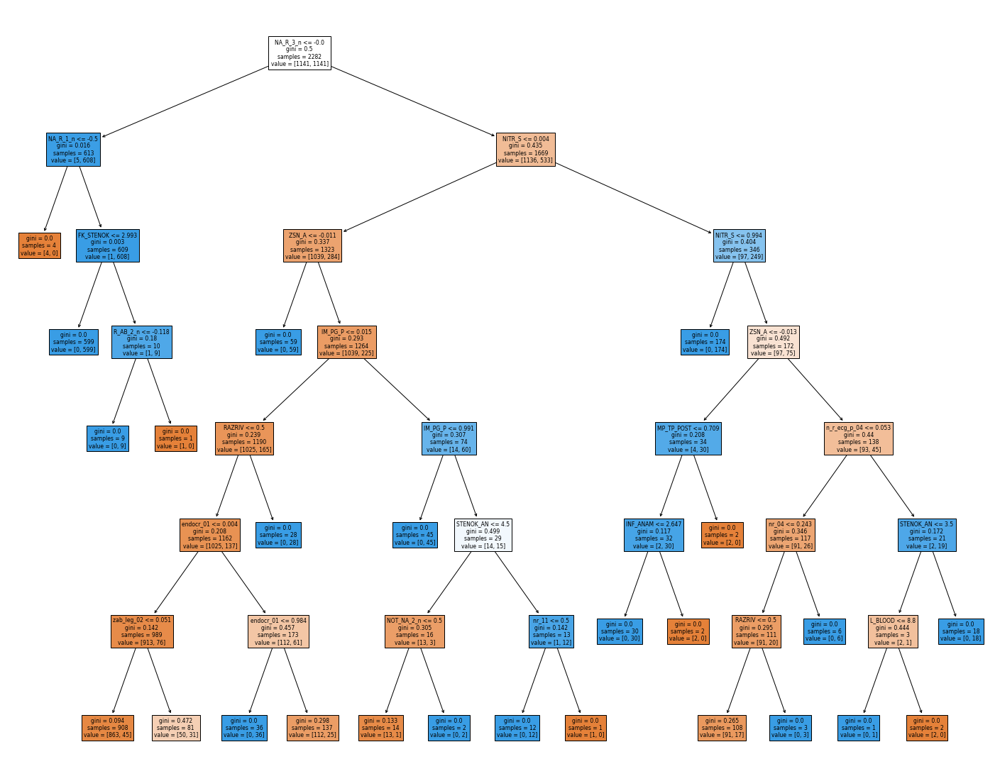

In [24]:
decision_tree_classifier_mixed(df_X_removed, df_Y,"DTC_removed_mixed")

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9574934268185802 -- Test: 0.9323529411764706
Balanced Accuracy [Higher Better]: 
Training: 0.9574934268185802 -- Test: 0.8182425213675213
Precision [Higher Better]: 
Training: 0.9952561669829222 -- Test: 0.8717948717948718
Recall [Higher Better]: 
Training: 0.9193689745836985 -- Test: 0.6538461538461539
F1-measure [Higher Better]: 
Training: 0.9558086560364465 -- Test: 0.7472527472527474
Cohen Kappa [Higher Better]: 
Training: 0.9149868536371604 -- Test: 0.7091206665674751
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9176583269921316 -- Test: 0.7189034481495723
ROC AUC [Higher Better]: 
Training: 0.9574934268185803 -- Test: 0.8182425213675213


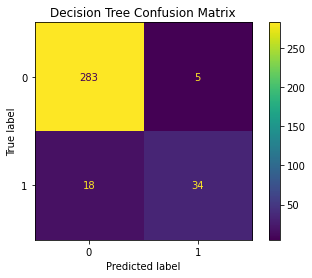

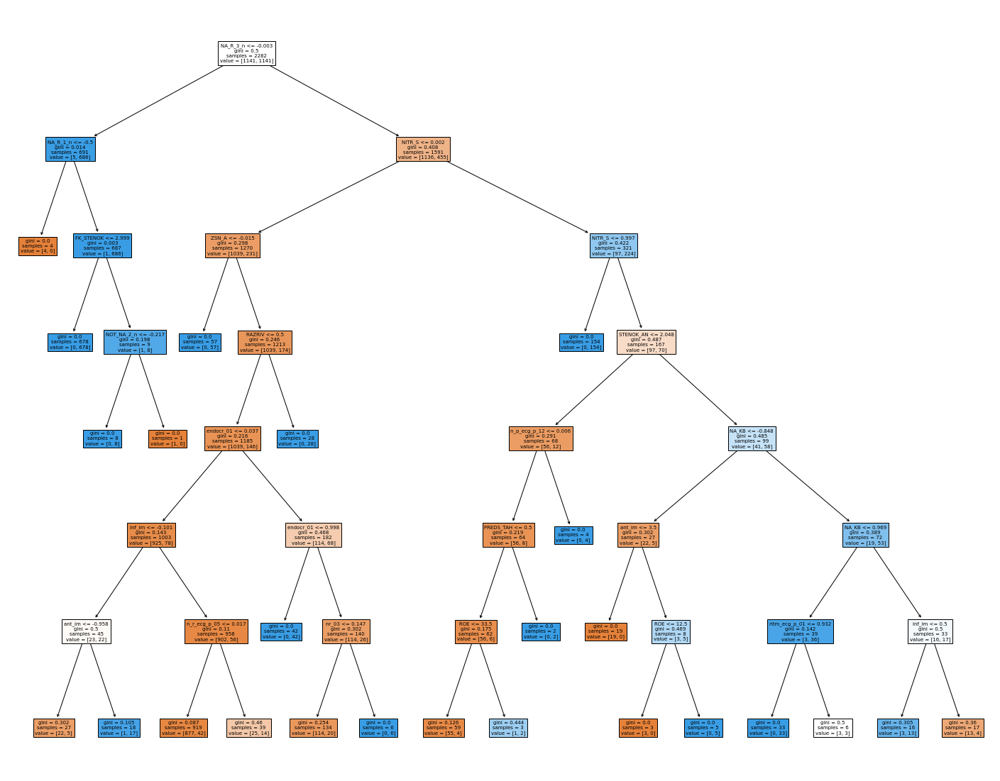

In [25]:
decision_tree_classifier_mixed(df_X_full, df_Y,"DTC_full_mixed")

In [26]:
def bagging_model(Base_model,X,Y):  
    
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    sm = SMOTE(random_state=42)
    X_train, y_train = sm.fit_resample(X_train, y_train)
    
    model = BaggingClassifier(base_estimator=Base_model, n_estimators=100, random_state=42)
    
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = model.predict(X_train)
    print("Evaluating {} Bagging Model on training & test set.".format(Base_model))

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("{} Bagging Confusion Matrix".format(Base_model))
    plt.show()
    return model



Evaluating DecisionTreeClassifier(max_depth=8) Bagging Model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9614373356704645 -- Test: 0.9411764705882353
Balanced Accuracy [Higher Better]: 
Training: 0.9614373356704645 -- Test: 0.8313301282051282
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9210526315789473
Recall [Higher Better]: 
Training: 0.922874671340929 -- Test: 0.6730769230769231
F1-measure [Higher Better]: 
Training: 0.959890610756609 -- Test: 0.7777777777777778
Cohen Kappa [Higher Better]: 
Training: 0.922874671340929 -- Test: 0.7448213749624737
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9256317526848996 -- Test: 0.7569959746231312
ROC AUC [Higher Better]: 
Training: 0.9614373356704645 -- Test: 0.8313301282051282


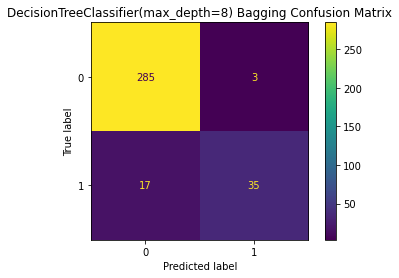

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=8),
                  n_estimators=100, random_state=42)

In [27]:
bagging_model(DecisionTreeClassifier(max_depth=8) ,df_X_removed, df_Y)

Evaluating DecisionTreeClassifier(max_depth=8) Bagging Model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9737072743207712 -- Test: 0.9470588235294117
Balanced Accuracy [Higher Better]: 
Training: 0.9737072743207713 -- Test: 0.8269230769230769
Precision [Higher Better]: 
Training: 1.0 -- Test: 1.0
Recall [Higher Better]: 
Training: 0.9474145486415425 -- Test: 0.6538461538461539
F1-measure [Higher Better]: 
Training: 0.972997299729973 -- Test: 0.7906976744186047
Cohen Kappa [Higher Better]: 
Training: 0.9474145486415425 -- Test: 0.7619047619047619
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9487271809886713 -- Test: 0.7844645405527361
ROC AUC [Higher Better]: 
Training: 0.9737072743207713 -- Test: 0.8269230769230769


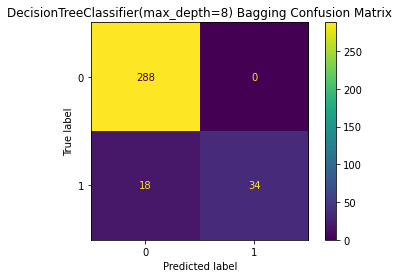

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=8),
                  n_estimators=100, random_state=42)

In [28]:
bagging_model(DecisionTreeClassifier(max_depth=8),df_X_full, df_Y)

In [29]:
### Optimise the hyper parametrs
### create new function to train using dt but also optimise params
criteria = ["gini", "entropy", "log_loss"]
def dtc_optimise(X,Y):
    random_state = 42
    classifier = DecisionTreeClassifier(random_state = random_state)

    dt_param_grid = {"criterion": criteria,
                "max_depth": range(1,8,1)}
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    sm = SMOTE(random_state=42)
    X_train, y_train = sm.fit_resample(X_train, y_train)
    
    cv_result = []
    clf = GridSearchCV(classifier, param_grid=dt_param_grid, cv = StratifiedKFold(n_splits = 10), scoring = "f1", n_jobs = -1,verbose = 1)
    clf.fit(X_train,y_train)
    cv_result.append(clf.best_score_)
    best_estimators = clf.best_estimator_
    print(best_estimators)
    return best_estimators,X_train, X_test, y_train, y_test





In [30]:
def perm_importance(clf, X_test, y_test):
    r = permutation_importance(clf, X_test, y_test,
                                   n_repeats=30,
                                   random_state=42)
    feature_names = list(X_test.columns)
    for i in r.importances_mean.argsort()[::-1]:
        if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
            print(f"{feature_names[i]:<8}"
                    f"{r.importances_mean[i]:.3f}"
                    f" +/- {r.importances_std[i]:.3f}")
        else:
            pass
    #Obtain average permutation importance of each feature across 10 permutations (& st. dev.)
    perm = PermutationImportance(clf).fit(X_test, y_test, n_iter=10)
    #Show average permutation feature importance & st.dev. across 10 runs 
    plt.plot(eli5.show_weights(perm, feature_names=feature_names)) 

def dtc_mixed_optimised(X,Y,S_name):
    best_estimators,X_train, X_test, y_train, y_test = dtc_optimise(X, Y)
    # Create the DecisionTreeRegressor model object
    clf = best_estimators
    clf.fit(X_train, y_train)
    #Obtain model's predictions on test data:
    y_test_pred = clf.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = clf.predict(X_train)
    
    print("Evaluating decision tree model on training & test set.")

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
   
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("{} Confusion Matrix".format(S_name))
    plt.show()
    
    display_tree(clf,X_train,S_name)
    
    #explainer = shap.Explainer(clf)
    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(X_train)
    shap.summary_plot(shap_values, X_train.values, plot_type="bar", class_names = class_names, feature_names = X_test.columns, show = False)
    plt.title("Shap Summary Plot")
    shap.initjs()
    #die
    shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X_train.iloc[0,:], matplotlib = True, show = False)
    plt.title("Shap Deaths Force Plot")
    #survive
    shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], X_train.iloc[0,:], matplotlib = True, show = False)
    plt.title("Shap Survivers Force Plot")
    
    r = permutation_importance(clf, X_test, y_test,
                                   n_repeats=30,
                                   random_state=42)
    feature_names = list(X_test.columns)
    for i in r.importances_mean.argsort()[::-1]:
        if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
            print(f"{feature_names[i]:<8}"
                    f"{r.importances_mean[i]:.3f}"
                    f" +/- {r.importances_std[i]:.3f}")
            
        else:
            pass
    
        #Obtain average permutation importance of each feature across 10 permutations (& st. dev.)
    
    #y_pred = clf.predict(X_test)
    #score_f1 = clf.f1_score(df_Y, y_pred)
    #base_score, score_decreases = get_score_importances(score_f1, X_test, df_Y)
    #feature_importances = np.mean(score_decreases, axis=0)
    perm = PermutationImportance(clf,scoring=make_scorer(f1_score)).fit(X_test, y_test, n_iter=10)
    #Show average permutation feature importance & st.dev. across 10 runs 
    display(show_weights(perm, feature_names=feature_names,target_names=class_names,top = (13)))

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(criterion='entropy', max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9478527607361963 -- Test: 0.9441176470588235
Balanced Accuracy [Higher Better]: 
Training: 0.9478527607361964 -- Test: 0.8330662393162394
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9459459459459459
Recall [Higher Better]: 
Training: 0.8957055214723927 -- Test: 0.6730769230769231
F1-measure [Higher Better]: 
Training: 0.9449838187702265 -- Test: 0.7865168539325843
Cohen Kappa [Higher Better]: 
Training: 0.8957055214723927 -- Test: 0.7554142056640921
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9006170724070864 -- Test: 0.769903596690581
ROC AUC [Higher Better]: 
Training: 0.9478527607361964 -- Test: 0.8330662393162394


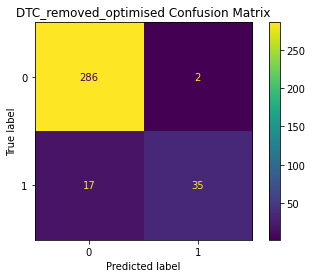

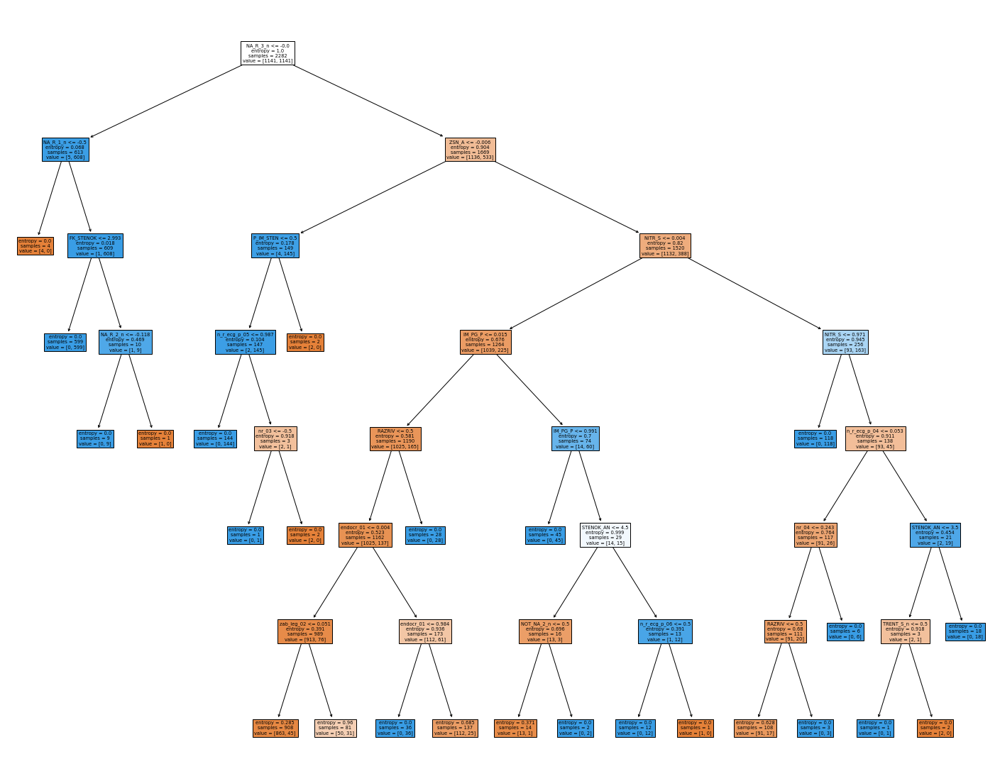

NA_R_3_n0.102 +/- 0.009
RAZRIV  0.046 +/- 0.005
ZSN_A   0.022 +/- 0.004
NITR_S  0.007 +/- 0.003
NA_R_1_n0.003 +/- 0.001
NA_R_2_n0.003 +/- 0.000


Weight,Feature
0.3594 ± 0.0424,NA_R_3_n
0.1970 ± 0.0104,RAZRIV
0.0672 ± 0.0108,ZSN_A
0.0138 ± 0.0000,NA_R_2_n
0.0129 ± 0.0154,NITR_S
0.0115 ± 0.0110,NA_R_1_n
0.0070 ± 0.0070,STENOK_AN
0.0055 ± 0.0135,FK_STENOK
0.0055 ± 0.0135,P_IM_STEN
0.0034 ± 0.0211,IM_PG_P


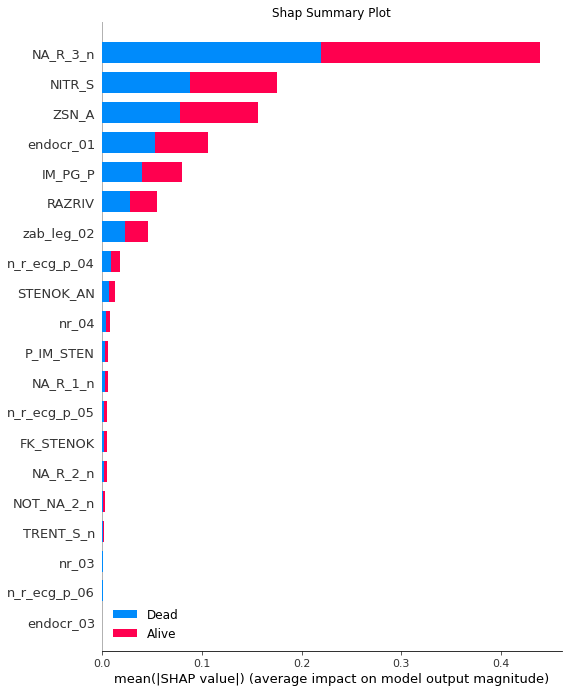

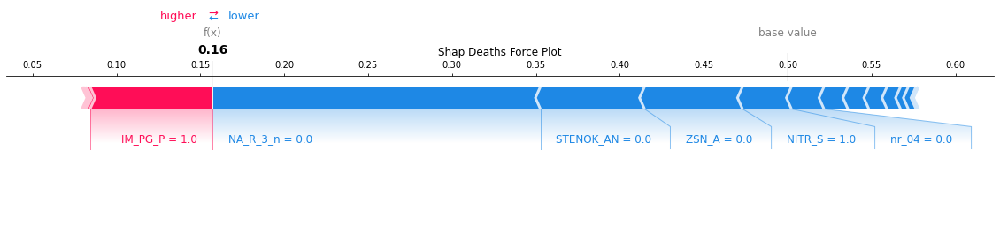

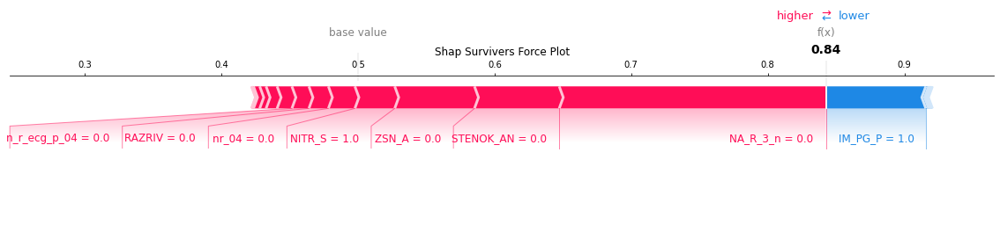

In [31]:
dtc_mixed_optimised(df_X_removed, df_Y,"DTC_removed_optimised")

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9574934268185802 -- Test: 0.9323529411764706
Balanced Accuracy [Higher Better]: 
Training: 0.9574934268185802 -- Test: 0.8182425213675213
Precision [Higher Better]: 
Training: 0.9952561669829222 -- Test: 0.8717948717948718
Recall [Higher Better]: 
Training: 0.9193689745836985 -- Test: 0.6538461538461539
F1-measure [Higher Better]: 
Training: 0.9558086560364465 -- Test: 0.7472527472527474
Cohen Kappa [Higher Better]: 
Training: 0.9149868536371604 -- Test: 0.7091206665674751
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9176583269921316 -- Test: 0.7189034481495723
ROC AUC [Higher Better]: 
Training: 0.9574934268185803 -- Test: 0.8182425213675213


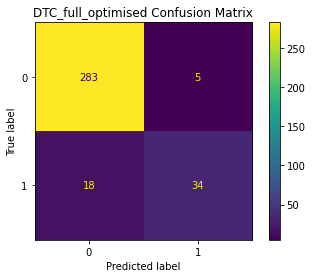

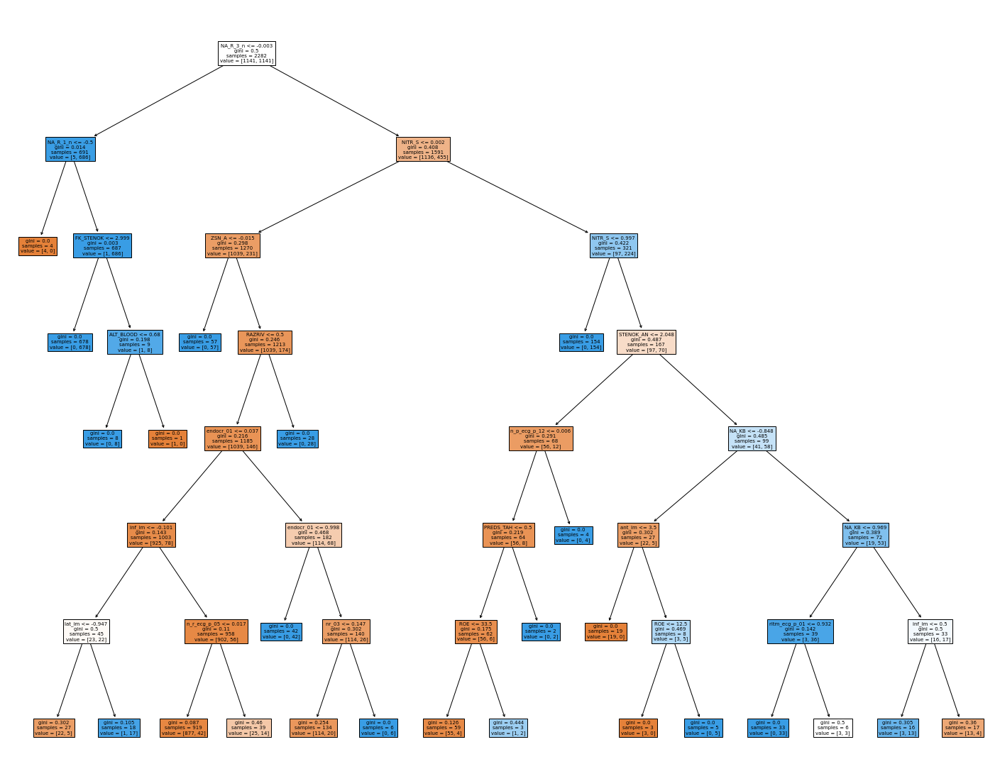

NA_R_3_n0.099 +/- 0.010
RAZRIV  0.041 +/- 0.006
inf_im  0.028 +/- 0.007
ZSN_A   0.020 +/- 0.004
nr_03   0.004 +/- 0.002
NA_R_1_n0.003 +/- 0.001
lat_im  0.003 +/- 0.001


Weight,Feature
0.3067 ± 0.0932,NA_R_3_n
0.1580 ± 0.0225,RAZRIV
0.0635 ± 0.0216,inf_im
0.0608 ± 0.0299,ZSN_A
0.0155 ± 0.0064,nr_03
0.0155 ± 0.0064,endocr_01
0.0137 ± 0.0136,NA_R_1_n
0.0081 ± 0.0000,lat_im
0.0081 ± 0.0102,n_p_ecg_p_12
0.0048 ± 0.0129,ant_im


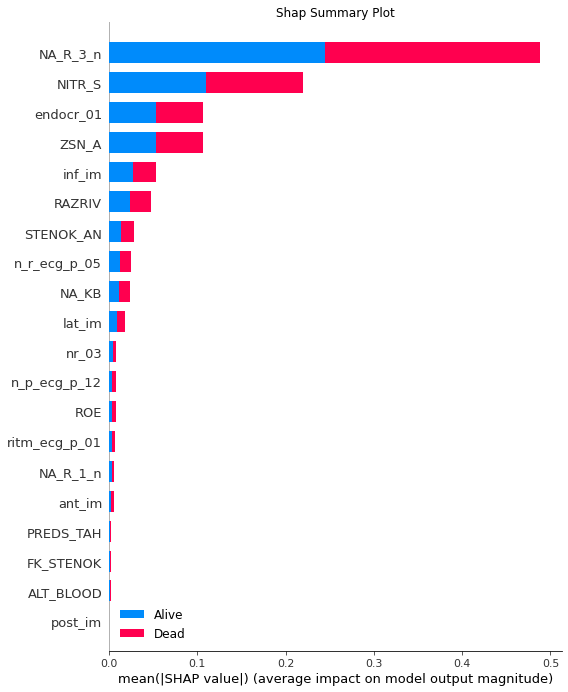

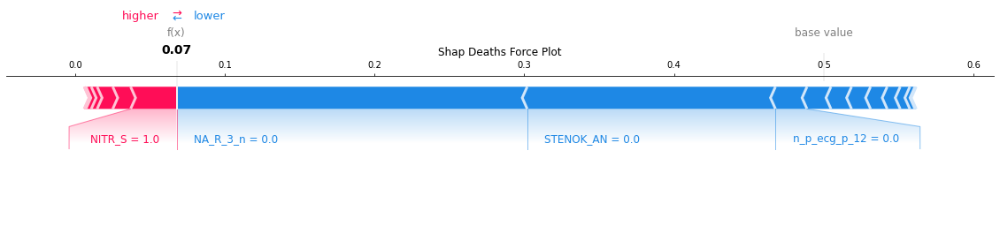

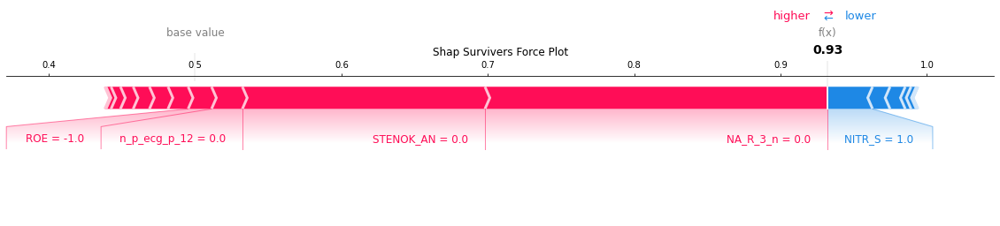

In [32]:
dtc_mixed_optimised(df_X_full, df_Y,"DTC_full_optimised")

In [33]:
def bagging_optimised(X,Y):
    best_estimators,X_train, X_test, y_train, y_test = dtc_optimise(X, Y)
    clf = BaggingClassifier(base_estimator=best_estimators, n_estimators=100, random_state=42)
    
    clf.fit(X_train, y_train)
    y_test_pred = clf.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = clf.predict(X_train)
    print("Evaluating {} Bagging Model on training & test set.".format(best_estimators))

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("{} Bagging Confusion Matrix".format(best_estimators))
    plt.show()
    
    
    return best_estimators

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(criterion='entropy', max_depth=7, random_state=42)
Evaluating DecisionTreeClassifier(criterion='entropy', max_depth=7, random_state=42) Bagging Model on training & test set.
Accuracy [Higher Better]: 
Training: 0.950920245398773 -- Test: 0.9411764705882353
Balanced Accuracy [Higher Better]: 
Training: 0.9509202453987731 -- Test: 0.8234508547008548
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9444444444444444
Recall [Higher Better]: 
Training: 0.901840490797546 -- Test: 0.6538461538461539
F1-measure [Higher Better]: 
Training: 0.9483870967741935 -- Test: 0.7727272727272727
Cohen Kappa [Higher Better]: 
Training: 0.901840490797546 -- Test: 0.7402200488997555
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9062168892044165 -- Test: 0.7567425816338075
ROC AUC [Higher Better]: 
Training: 0.9509202453987731 -- Test: 0.8234508547008548


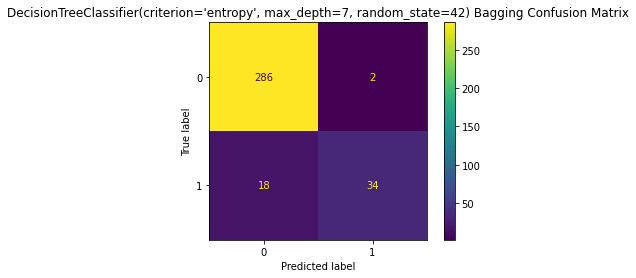

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating DecisionTreeClassifier(max_depth=7, random_state=42) Bagging Model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9623137598597721 -- Test: 0.9470588235294117
Balanced Accuracy [Higher Better]: 
Training: 0.9623137598597722 -- Test: 0.8269230769230769
Precision [Higher Better]: 
Training: 1.0 -- Test: 1.0
Recall [Higher Better]: 
Training: 0.9246275197195443 -- Test: 0.6538461538461539
F1-measure [Higher Better]: 
Training: 0.9608378870673953 -- Test: 0.7906976744186047
Cohen Kappa [Higher Better]: 
Training: 0.9246275197195443 -- Test: 0.7619047619047619
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9272651729125253 -- Test: 0.7844645405527361
ROC AUC [Higher Better]: 
Training: 0.9623137598597722 -- Test: 0.8269230769230769


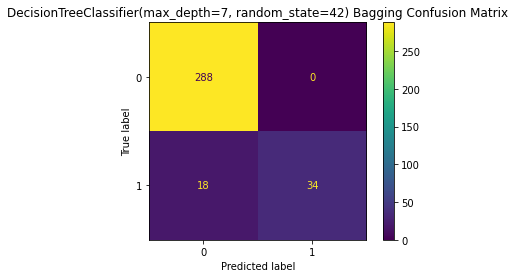

DecisionTreeClassifier(max_depth=7, random_state=42)

In [34]:
bagging_optimised(df_X_removed, df_Y)
bagging_optimised(df_X_full, df_Y)

In [35]:
def GDB_classifier(X,Y):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    sm = SMOTE(random_state=42)
    X_train, y_train = sm.fit_resample(X_train, y_train)
    clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=11, random_state=0)
    clf.fit(X_train,y_train)
    
    #Obtain model's predictions on test data:
    y_test_pred = clf.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = clf.predict(X_train)
    print("Evaluating decision tree model on training & test set.")

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
   
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("Decision Tree Confusion Matrix")
    plt.show()
    

    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(X_train)
    shap.summary_plot(shap_values, X_test.values, plot_type="bar", class_names = class_names, feature_names = X_test.columns)
    #shap.plots.bar(shap_values)
    shap.initjs()
    shap.force_plot(explainer.expected_value[0], shap_values[0], X_train.iloc[0,:], matplotlib = True, show = False)
    
    plt.show()


Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.9382352941176471
Balanced Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.8374732905982906
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.8780487804878049
Recall [Higher Better]: 
Training: 1.0 -- Test: 0.6923076923076923
F1-measure [Higher Better]: 
Training: 1.0 -- Test: 0.7741935483870966
Cohen Kappa [Higher Better]: 
Training: 1.0 -- Test: 0.7389969293756398
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 1.0 -- Test: 0.7460016620005383
ROC AUC [Higher Better]: 
Training: 1.0 -- Test: 0.8374732905982906


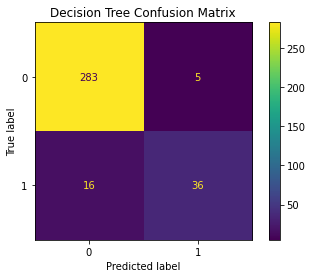

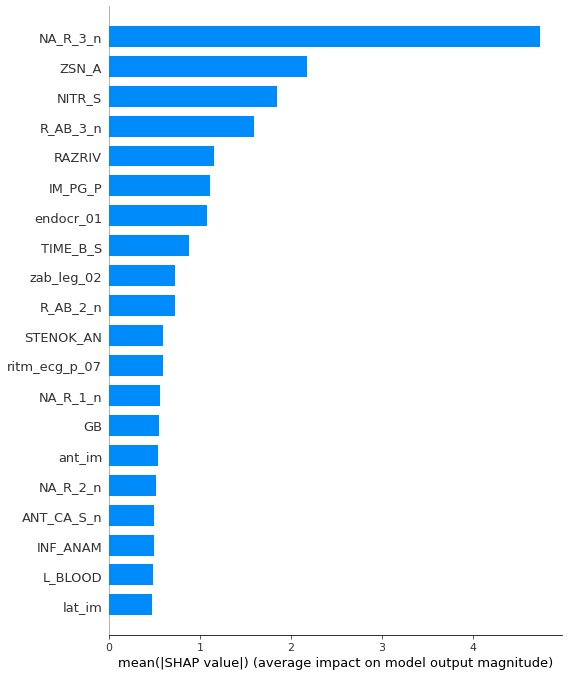

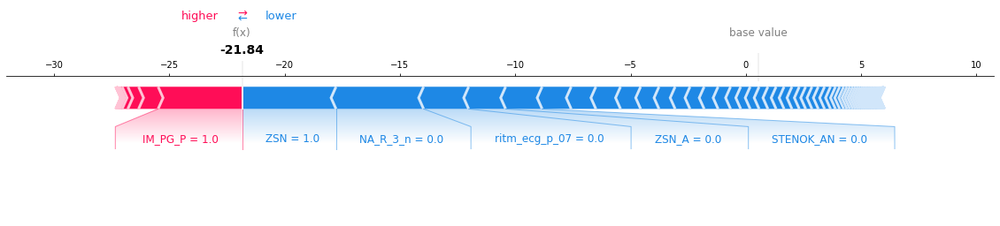

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.9441176470588235
Balanced Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.8409455128205128
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9230769230769231
Recall [Higher Better]: 
Training: 1.0 -- Test: 0.6923076923076923
F1-measure [Higher Better]: 
Training: 1.0 -- Test: 0.7912087912087913
Cohen Kappa [Higher Better]: 
Training: 1.0 -- Test: 0.7597083767296533
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 1.0 -- Test: 0.7701890487309517
ROC AUC [Higher Better]: 
Training: 1.0 -- Test: 0.8409455128205129


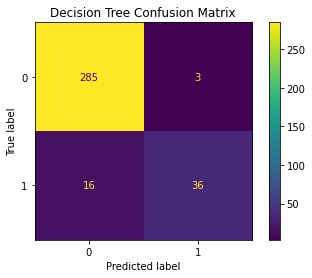

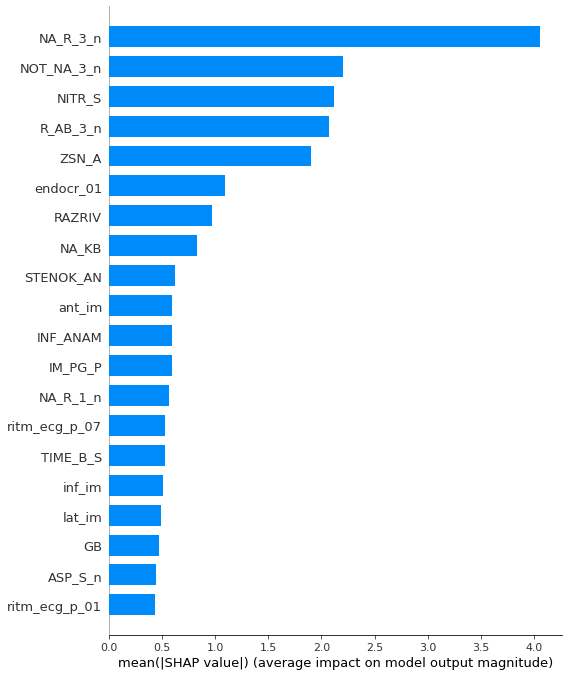

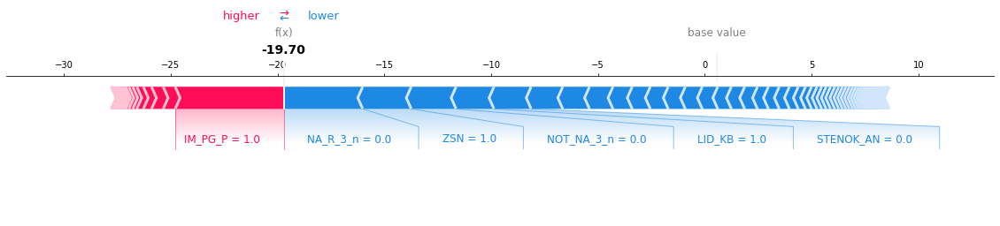

In [36]:
GDB_classifier(df_X_removed, df_Y)
GDB_classifier(df_X_full, df_Y)

In [37]:
def HGDB_classifier(X,Y):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    sm = SMOTE(random_state=42)
    X_train, y_train = sm.fit_resample(X_train, y_train)
    clf = HistGradientBoostingClassifier(max_iter = 100)
    clf.fit(X_train,y_train)
    
    #Obtain model's predictions on test data:
    y_test_pred = clf.predict(X_test)

    #Obtain model's predictions on training data:
    y_train_pred = clf.predict(X_train)
    print("Evaluating decision tree model on training & test set.")

    evaluate(X_train, X_test, y_train, y_test,y_test_pred,y_train_pred)
   
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
    plt.title("Decision Tree Confusion Matrix")
    plt.show()
    
     
    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(X_train)
    shap.summary_plot(shap_values, X_test.values, plot_type="bar", class_names = class_names, feature_names = X_test.columns)
    #shap.plots.bar(shap_values)
    shap.initjs()
    shap.force_plot(explainer.expected_value[0], shap_values[0], X_train.iloc[0,:], matplotlib = True, show = False)
    feature_names = list(X_test.columns)
    perm = PermutationImportance(clf,scoring=make_scorer(f1_score)).fit(X_test, y_test, n_iter=10)
    #Show average permutation feature importance & st.dev. across 10 runs 
    display(show_weights(perm, feature_names=feature_names,target_names=class_names,top = (130)))
    
    plt.show()


Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.9470588235294117
Balanced Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.8348023504273505
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9722222222222222
Recall [Higher Better]: 
Training: 1.0 -- Test: 0.6730769230769231
F1-measure [Higher Better]: 
Training: 1.0 -- Test: 0.7954545454545455
Cohen Kappa [Higher Better]: 
Training: 1.0 -- Test: 0.76619804400978
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 1.0 -- Test: 0.7833004344161666
ROC AUC [Higher Better]: 
Training: 1.0 -- Test: 0.8348023504273504


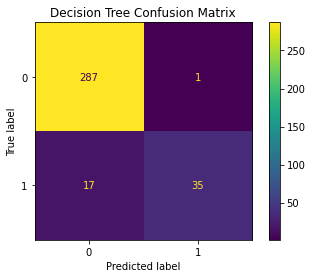

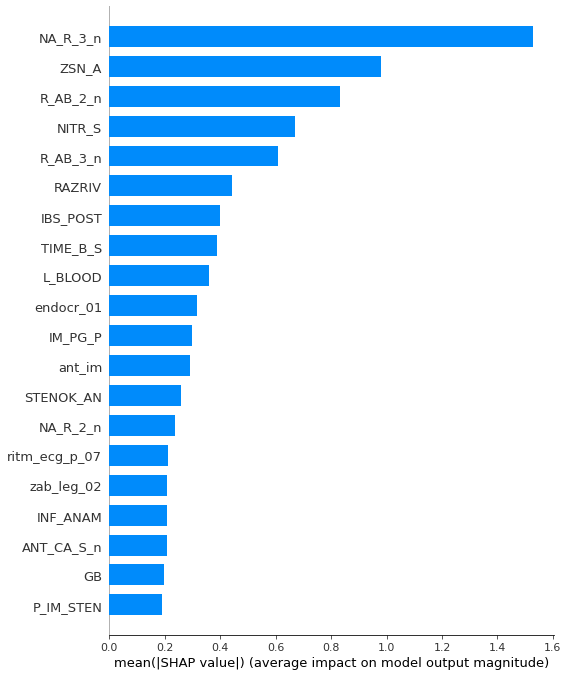

Weight,Feature
0.1821 ± 0.0235,RAZRIV
0.1284 ± 0.0531,NA_R_3_n
0.0677 ± 0.0258,ZSN_A
0.0266 ± 0.0308,R_AB_3_n
0.0072 ± 0.0072,P_IM_STEN
0.0054 ± 0.0088,STENOK_AN
0.0053 ± 0.0142,IBS_POST
0.0026 ± 0.0208,NITR_S
0.0018 ± 0.0072,IM_PG_P
0.0018 ± 0.0072,zab_leg_02


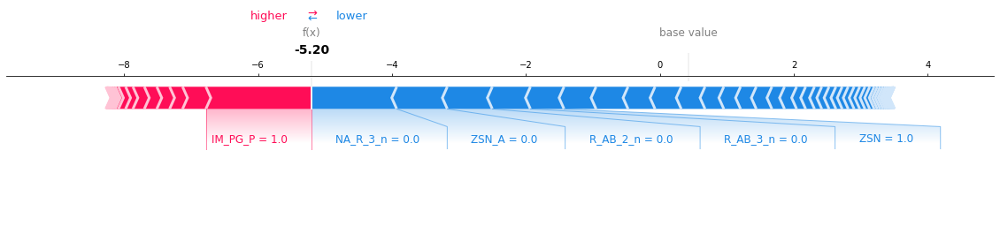

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.9529411764705882
Balanced Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.8540331196581197
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9736842105263158
Recall [Higher Better]: 
Training: 1.0 -- Test: 0.7115384615384616
F1-measure [Higher Better]: 
Training: 1.0 -- Test: 0.8222222222222223
Cohen Kappa [Higher Better]: 
Training: 1.0 -- Test: 0.795857099969979
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 1.0 -- Test: 0.8088659124247968
ROC AUC [Higher Better]: 
Training: 1.0 -- Test: 0.8540331196581198


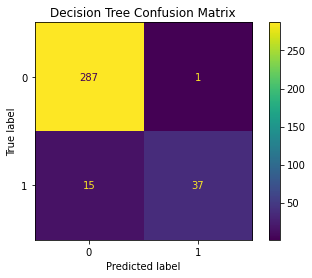

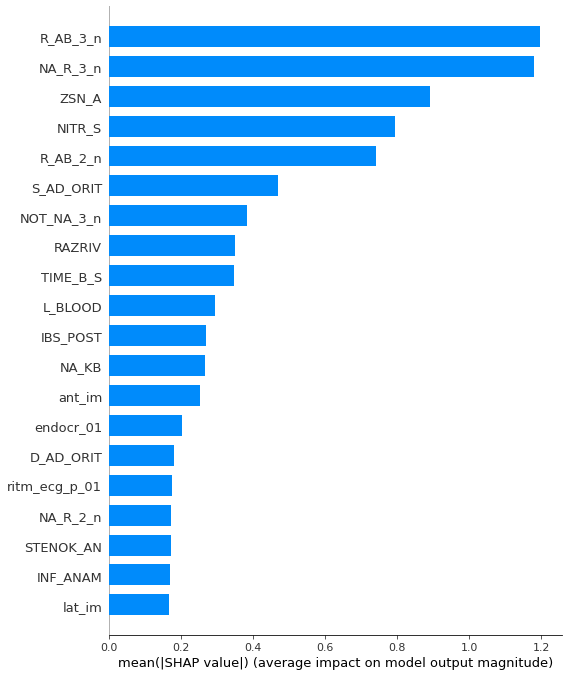

Weight,Feature
0.1747 ± 0.0388,RAZRIV
0.0609 ± 0.0279,ZSN_A
0.0519 ± 0.0113,R_AB_3_n
0.0373 ± 0.0204,NA_R_3_n
0.0297 ± 0.0322,S_AD_ORIT
0.0150 ± 0.0072,NITR_S
0.0132 ± 0.0000,ROE
0.0126 ± 0.0087,IBS_POST
0.0124 ± 0.0142,REC_IM
0.0106 ± 0.0106,ASP_S_n


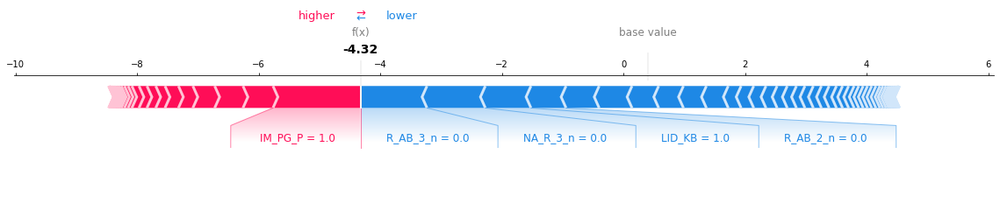

In [38]:
HGDB_classifier(df_X_removed, df_Y)
HGDB_classifier(df_X_full, df_Y)

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(criterion='entropy', max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9456617002629273 -- Test: 0.9470588235294117
Balanced Accuracy [Higher Better]: 
Training: 0.9456617002629273 -- Test: 0.8426816239316239
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9473684210526315
Recall [Higher Better]: 
Training: 0.8913234005258545 -- Test: 0.6923076923076923
F1-measure [Higher Better]: 
Training: 0.9425393883225208 -- Test: 0.7999999999999999
Cohen Kappa [Higher Better]: 
Training: 0.8913234005258546 -- Test: 0.7703392374662263
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.8966340218673171 -- Test: 0.782930943523964
ROC AUC [Higher Better]: 
Training: 0.9456617002629273 -- Test: 0.8426816239316239


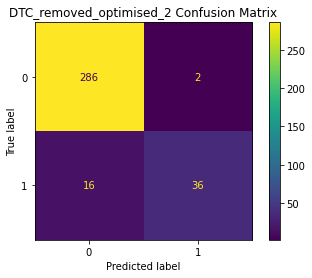

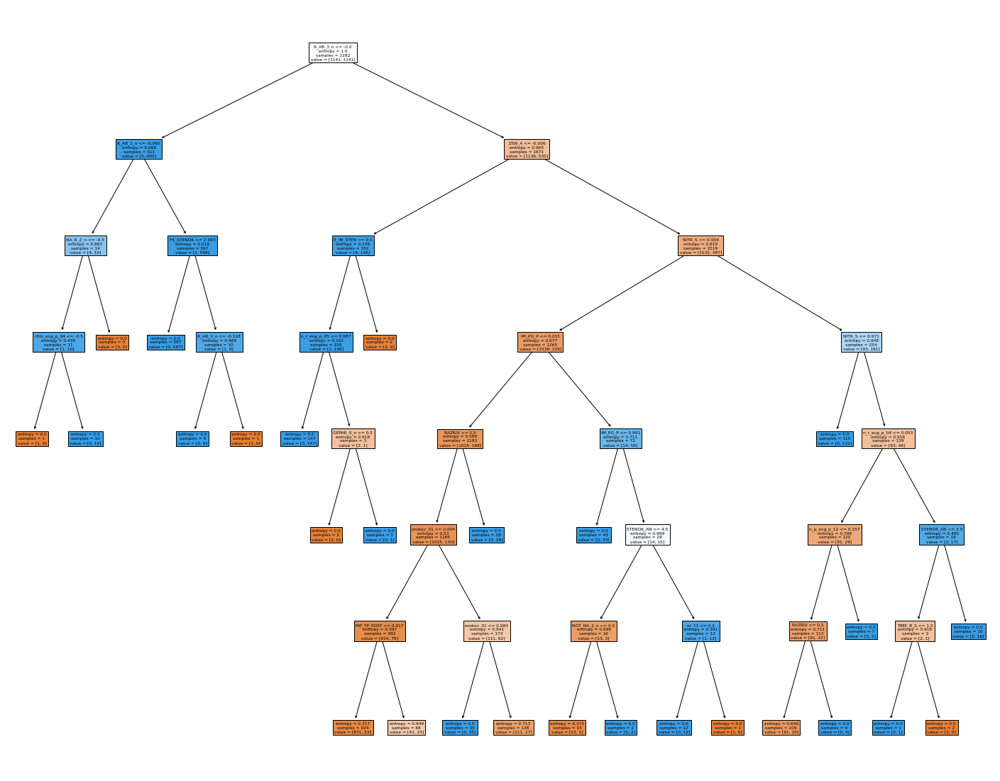

R_AB_3_n0.103 +/- 0.008
RAZRIV  0.050 +/- 0.006
ZSN_A   0.022 +/- 0.004
NA_R_2_n0.008 +/- 0.001


Weight,Feature
0.3428 ± 0.0666,R_AB_3_n
0.1959 ± 0.0434,RAZRIV
0.0758 ± 0.0414,ZSN_A
0.0358 ± 0.0223,NA_R_2_n
0.0141 ± 0.0151,IM_PG_P
0.0054 ± 0.0132,ritm_ecg_p_04
0.0052 ± 0.0180,STENOK_AN
0.0027 ± 0.0108,P_IM_STEN
0.0018 ± 0.0070,n_r_ecg_p_04
0.0016 ± 0.0205,n_p_ecg_p_12


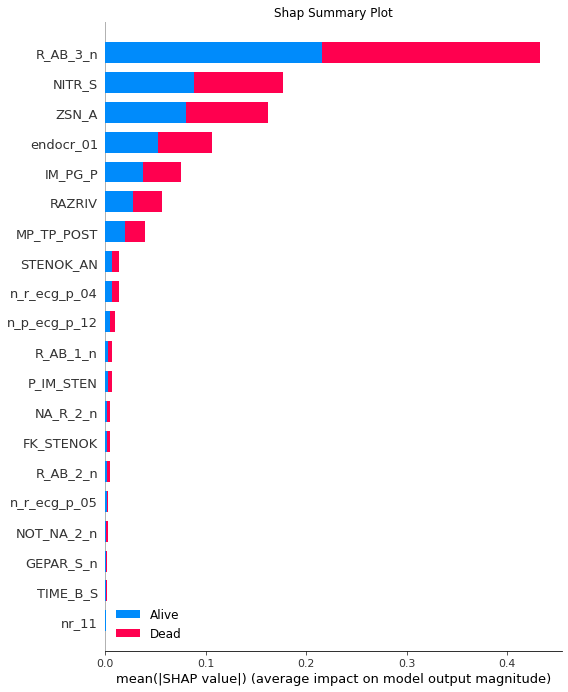

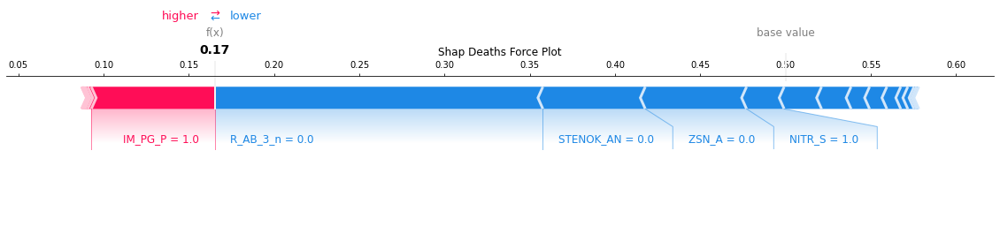

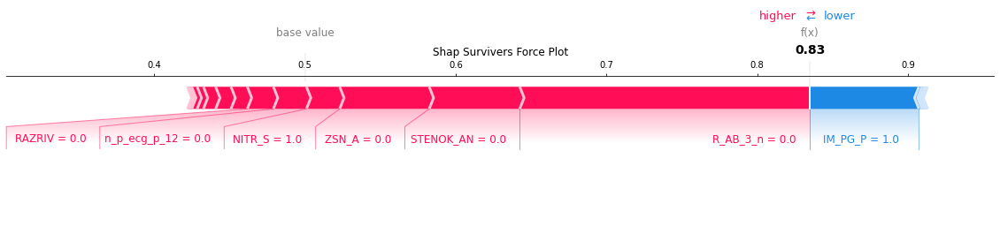

In [39]:
df_X_removed_2 = df_X_removed.drop(columns = "NA_R_3_n")

dtc_mixed_optimised(df_X_removed_2, df_Y,"DTC_removed_optimised_2")

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9526730937773883 -- Test: 0.9441176470588235
Balanced Accuracy [Higher Better]: 
Training: 0.9526730937773883 -- Test: 0.8409455128205128
Precision [Higher Better]: 
Training: 0.9933142311365807 -- Test: 0.9230769230769231
Recall [Higher Better]: 
Training: 0.9114811568799299 -- Test: 0.6923076923076923
F1-measure [Higher Better]: 
Training: 0.9506398537477149 -- Test: 0.7912087912087913
Cohen Kappa [Higher Better]: 
Training: 0.9053461875547765 -- Test: 0.7597083767296533
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.9084342545058814 -- Test: 0.7701890487309517
ROC AUC [Higher Better]: 
Training: 0.9526730937773883 -- Test: 0.8409455128205129


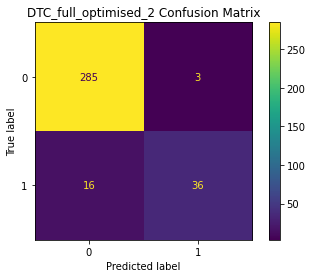

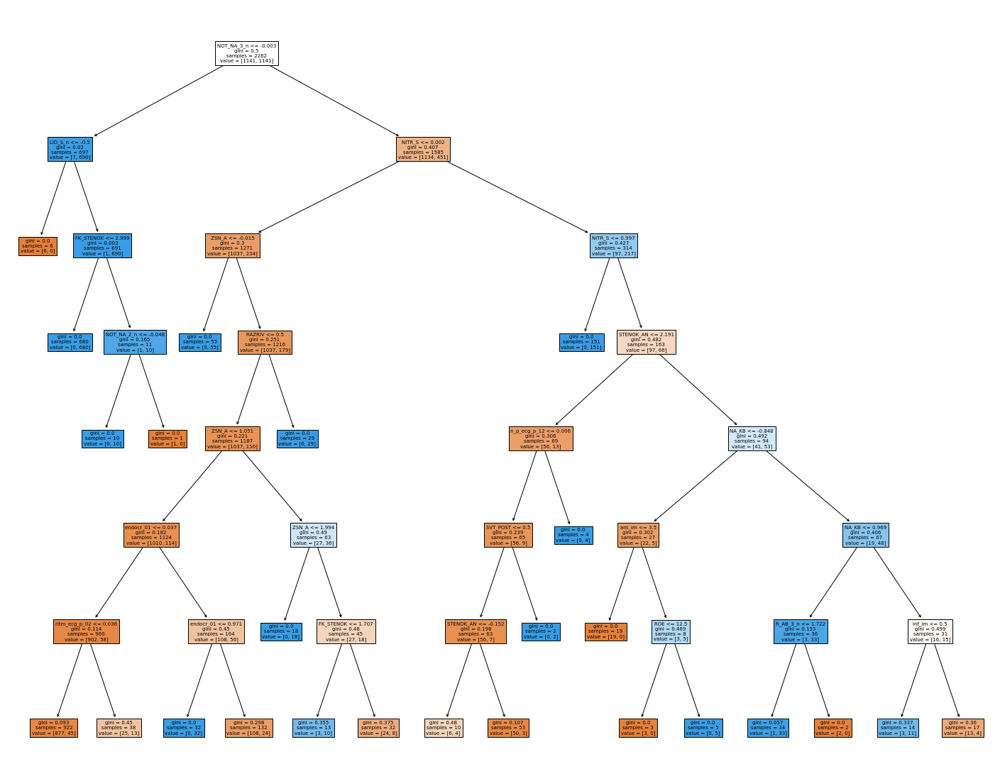

NOT_NA_3_n0.102 +/- 0.009
ZSN_A   0.044 +/- 0.006
RAZRIV  0.042 +/- 0.006
LID_S_n 0.003 +/- 0.001
NOT_NA_2_n0.003 +/- 0.000


Weight,Feature
0.3655 ± 0.0776,NOT_NA_3_n
0.1503 ± 0.0147,RAZRIV
0.1325 ± 0.0284,ZSN_A
0.0134 ± 0.0000,NOT_NA_2_n
0.0113 ± 0.0107,LID_S_n
0.0089 ± 0.0375,NA_KB
0.0086 ± 0.0108,n_p_ecg_p_12
0.0049 ± 0.0250,NITR_S
0.0041 ± 0.0237,inf_im
0.0034 ± 0.0084,ant_im


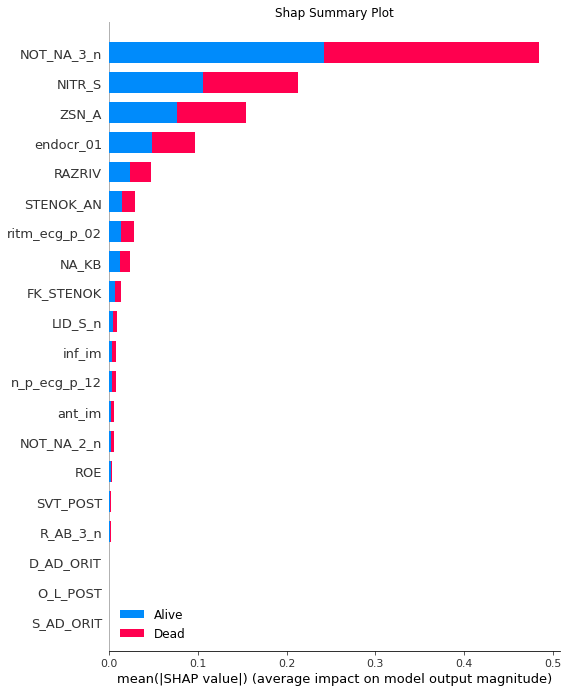

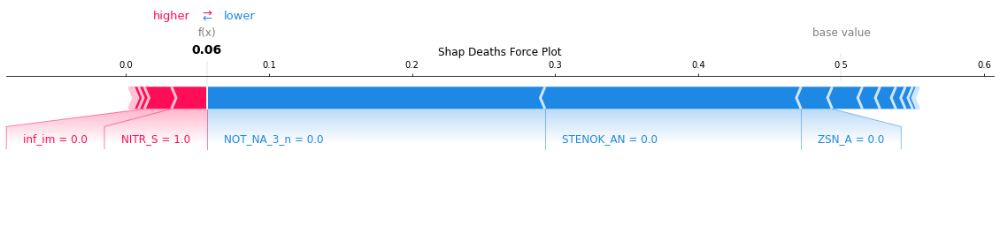

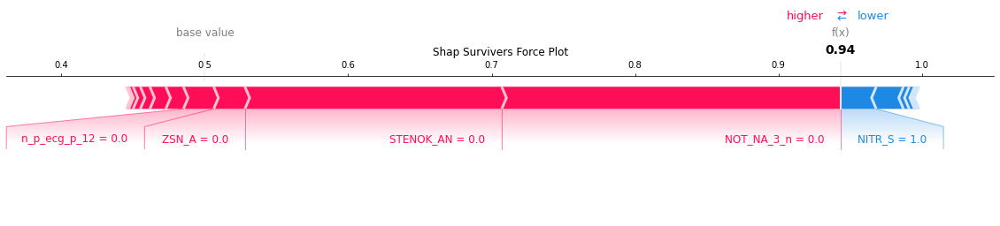

In [40]:
df_X_full_2 = df_X_full.drop(columns = "NA_R_3_n")

dtc_mixed_optimised(df_X_full_2, df_Y,"DTC_full_optimised_2")

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9474145486415425 -- Test: 0.9352941176470588
Balanced Accuracy [Higher Better]: 
Training: 0.9474145486415425 -- Test: 0.859375
Precision [Higher Better]: 
Training: 0.9848053181386515 -- Test: 0.8125
Recall [Higher Better]: 
Training: 0.908851884312007 -- Test: 0.75
F1-measure [Higher Better]: 
Training: 0.9453053783044667 -- Test: 0.78
Cohen Kappa [Higher Better]: 
Training: 0.894829097283085 -- Test: 0.7421400992829564
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.8975023926792807 -- Test: 0.7429570856815241
ROC AUC [Higher Better]: 
Training: 0.9474145486415425 -- Test: 0.859375


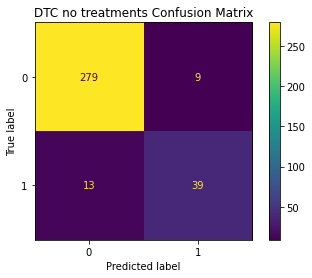

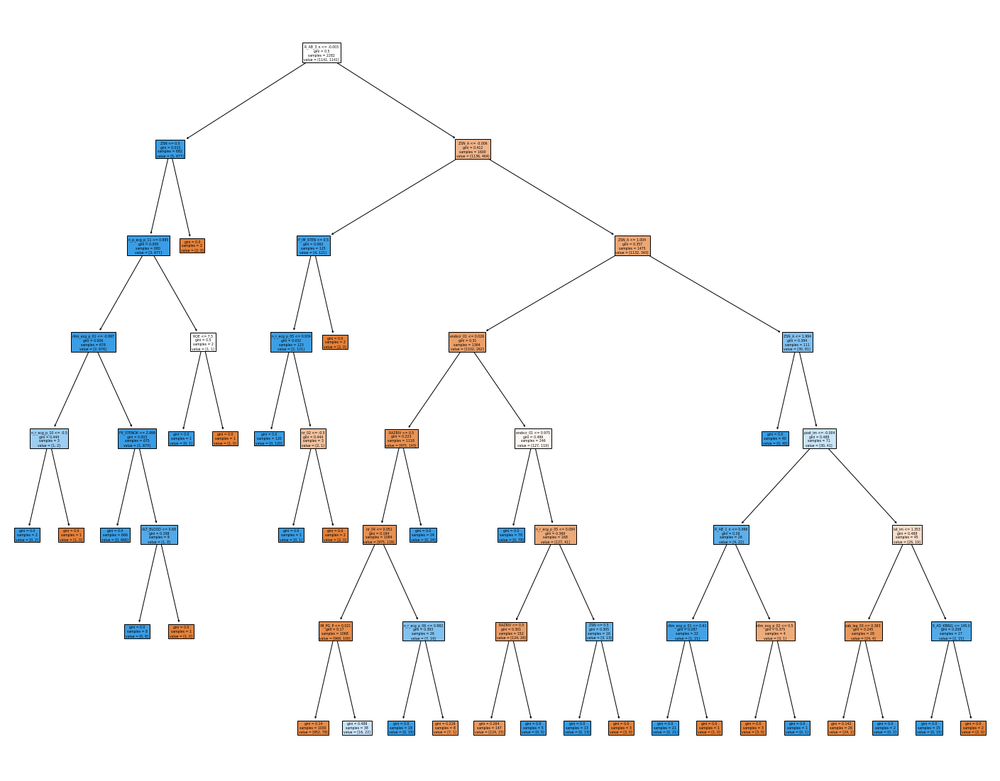

R_AB_3_n0.092 +/- 0.008
RAZRIV  0.047 +/- 0.005
ZSN_A   0.035 +/- 0.006
ZSN     0.017 +/- 0.006
ritm_ecg_p_010.009 +/- 0.004
zab_leg_030.006 +/- 0.002
post_im 0.006 +/- 0.001


Weight,Feature
0.3324 ± 0.0311,R_AB_3_n
0.1540 ± 0.0323,RAZRIV
0.1266 ± 0.0404,ZSN_A
0.1123 ± 0.0470,ZSN
0.0379 ± 0.0287,ritm_ecg_p_01
0.0249 ± 0.0000,post_im
0.0239 ± 0.0130,zab_leg_03
0.0077 ± 0.0097,n_r_ecg_p_05
0.0049 ± 0.0121,P_IM_STEN
0.0046 ± 0.0158,nr_04


Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9430324276950044 -- Test: 0.9264705882352942
Balanced Accuracy [Higher Better]: 
Training: 0.9430324276950044 -- Test: 0.7832532051282051
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9090909090909091
Recall [Higher Better]: 
Training: 0.8860648553900088 -- Test: 0.5769230769230769
F1-measure [Higher Better]: 
Training: 0.9395910780669146 -- Test: 0.7058823529411764
Cohen Kappa [Higher Better]: 
Training: 0.8860648553900088 -- Test: 0.6662478404272028
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.8918725604278113 -- Test: 0.6887737487257386
ROC AUC [Higher Better]: 
Training: 0.9430324276950044 -- Test: 0.7832532051282052


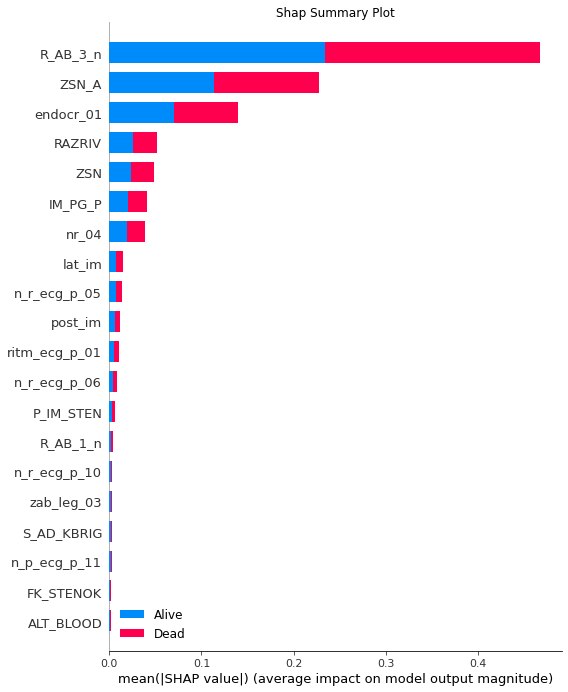

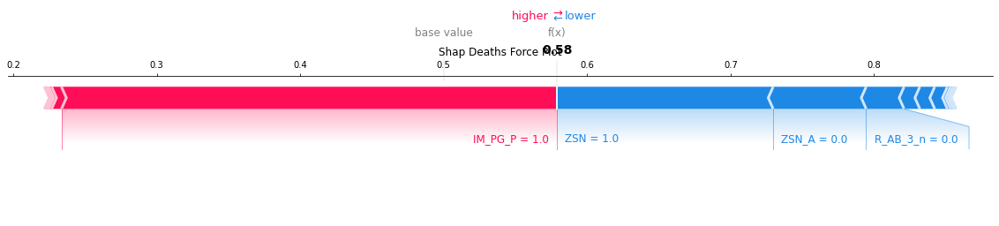

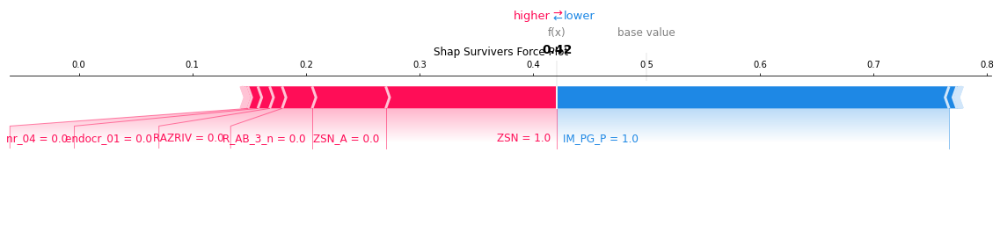

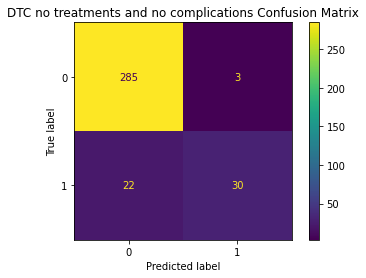

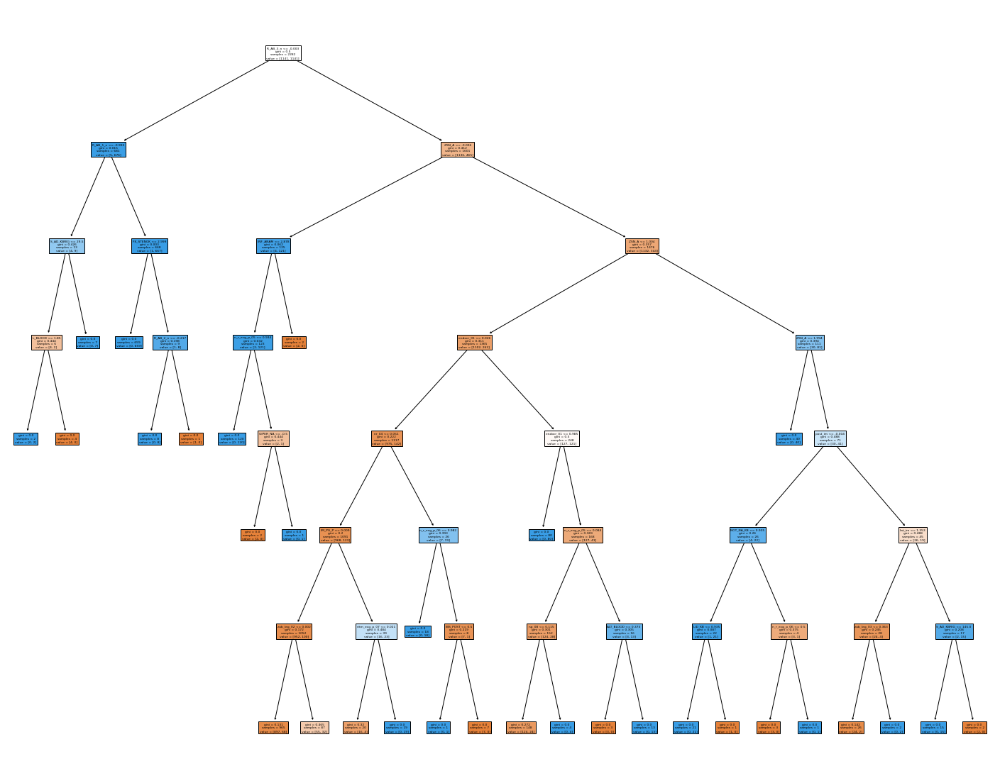

R_AB_3_n0.104 +/- 0.009
ZSN_A   0.036 +/- 0.006
zab_leg_030.006 +/- 0.002
S_AD_KBRIG0.004 +/- 0.002


Weight,Feature
0.3877 ± 0.0577,R_AB_3_n
0.1276 ± 0.0299,ZSN_A
0.0328 ± 0.0064,zab_leg_03
0.0194 ± 0.0077,nr_04
0.0186 ± 0.0234,S_AD_KBRIG
0.0123 ± 0.0123,post_im
0.0065 ± 0.0122,n_r_ecg_p_05
0.0032 ± 0.0133,ritm_ecg_p_07
0.0031 ± 0.0123,FK_STENOK
0 ± 0.0000,D_AD_KBRIG


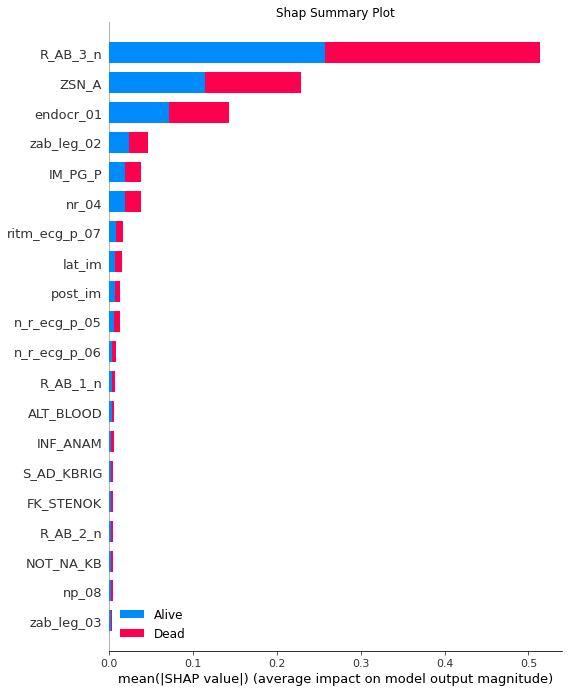

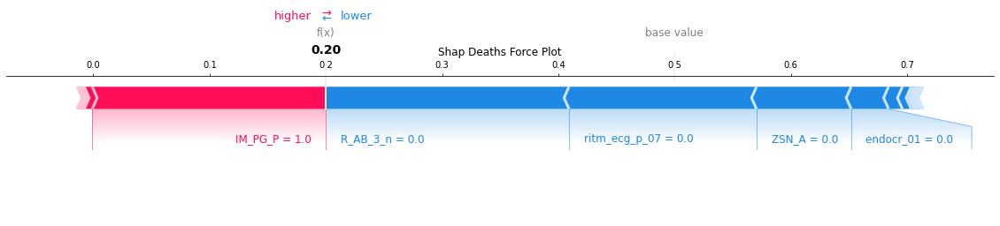

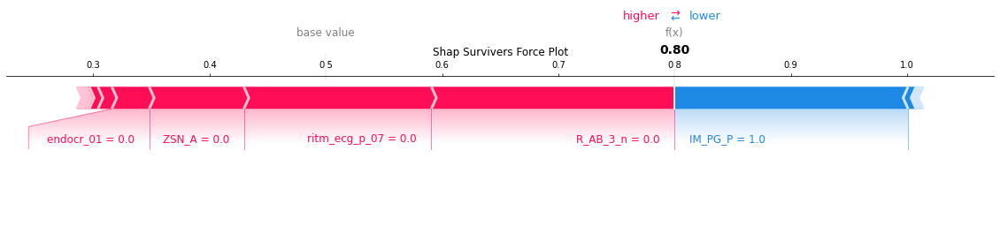

In [47]:
drop1 = df_X_full.iloc[:,76:82].columns
drop2 = df_X_full.iloc[:,96:112].columns
drop = drop1.append(drop2)
df_X_full_3 = df_X_full.drop(columns = drop)
dtc_mixed_optimised(df_X_full_3, df_Y,"DTC no treatments")

drop1 = df_X_full.iloc[:,76:82].columns
drop2 = df_X_full.iloc[:,96:112].columns
drop3 = df_X_full.iloc[:,113:123].columns
drop = drop1.append(drop2)
drop = drop.append(drop3)
df_X_no_complications = df_X_full.drop(columns = drop)
dtc_mixed_optimised(df_X_no_complications, df_Y,"DTC no treatments and no complications")

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9430324276950044 -- Test: 0.9264705882352942
Balanced Accuracy [Higher Better]: 
Training: 0.9430324276950044 -- Test: 0.7832532051282051
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9090909090909091
Recall [Higher Better]: 
Training: 0.8860648553900088 -- Test: 0.5769230769230769
F1-measure [Higher Better]: 
Training: 0.9395910780669146 -- Test: 0.7058823529411764
Cohen Kappa [Higher Better]: 
Training: 0.8860648553900088 -- Test: 0.6662478404272028
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.8918725604278113 -- Test: 0.6887737487257386
ROC AUC [Higher Better]: 
Training: 0.9430324276950044 -- Test: 0.7832532051282052


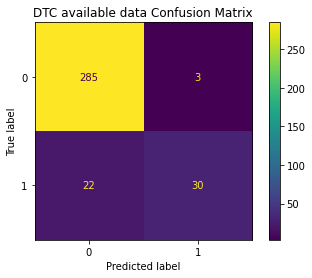

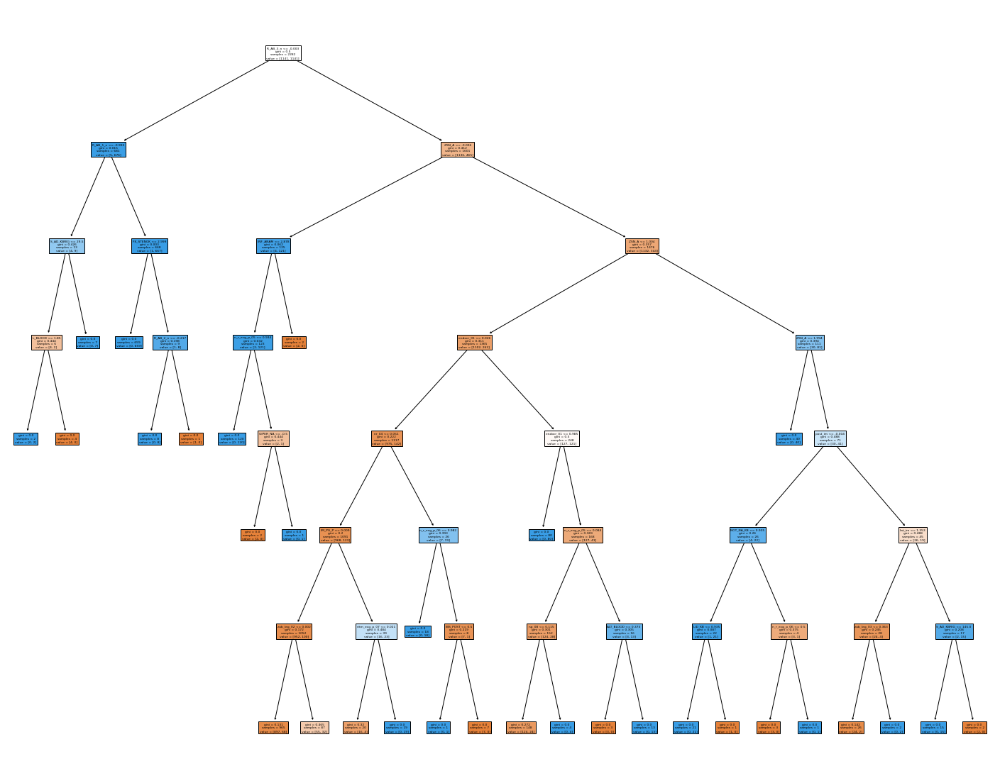

R_AB_3_n0.104 +/- 0.009
ZSN_A   0.036 +/- 0.006
zab_leg_030.006 +/- 0.002
S_AD_KBRIG0.004 +/- 0.002


Weight,Feature
0.4052 ± 0.0149,R_AB_3_n
0.1403 ± 0.0253,ZSN_A
0.0280 ± 0.0126,zab_leg_03
0.0193 ± 0.0127,nr_04
0.0156 ± 0.0279,S_AD_KBRIG
0.0123 ± 0.0123,post_im
0.0052 ± 0.0157,n_r_ecg_p_05
0.0016 ± 0.0124,ritm_ecg_p_07
0 ± 0.0000,D_AD_KBRIG
0 ± 0.0000,zab_leg_02


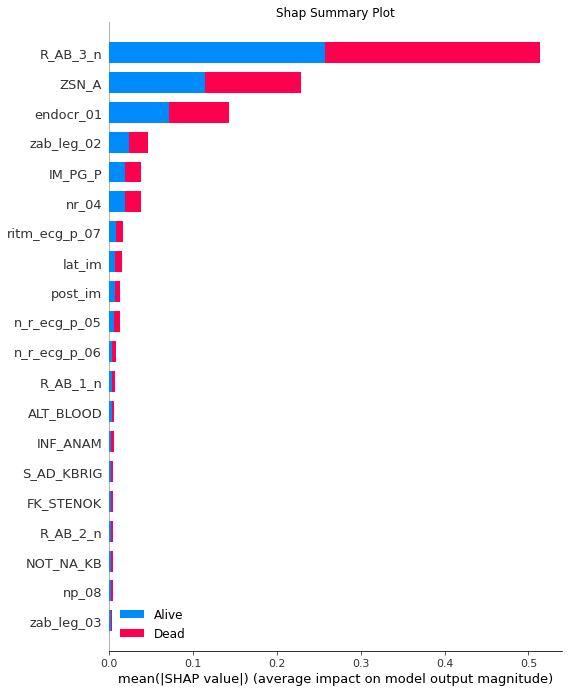

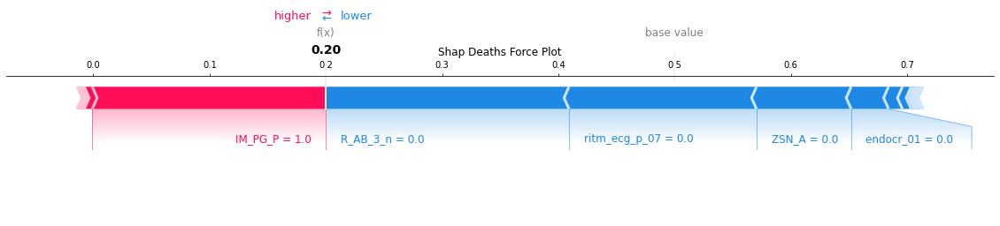

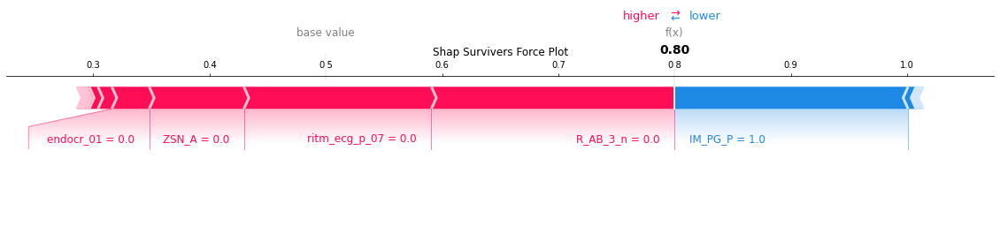

In [48]:
drop1 = df_X_full.iloc[:,76:82].columns
drop2 = df_X_full.iloc[:,96:112].columns
drop3 = df_X_full.iloc[:,113:123].columns
drop = drop1.append(drop2)
drop = drop.append(drop3)
df_X_no_complications = df_X_full.drop(columns = drop)
dtc_mixed_optimised(df_X_no_complications, df_Y,"DTC available data")

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.9294117647058824
Balanced Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.7771100427350428
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9666666666666667
Recall [Higher Better]: 
Training: 1.0 -- Test: 0.5576923076923077
F1-measure [Higher Better]: 
Training: 1.0 -- Test: 0.7073170731707317
Cohen Kappa [Higher Better]: 
Training: 1.0 -- Test: 0.6704361873990308
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 1.0 -- Test: 0.7032968988220103
ROC AUC [Higher Better]: 
Training: 1.0 -- Test: 0.7771100427350428


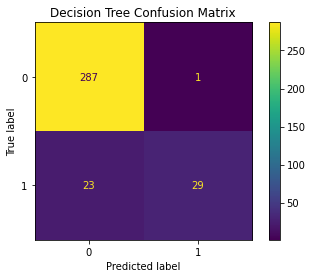

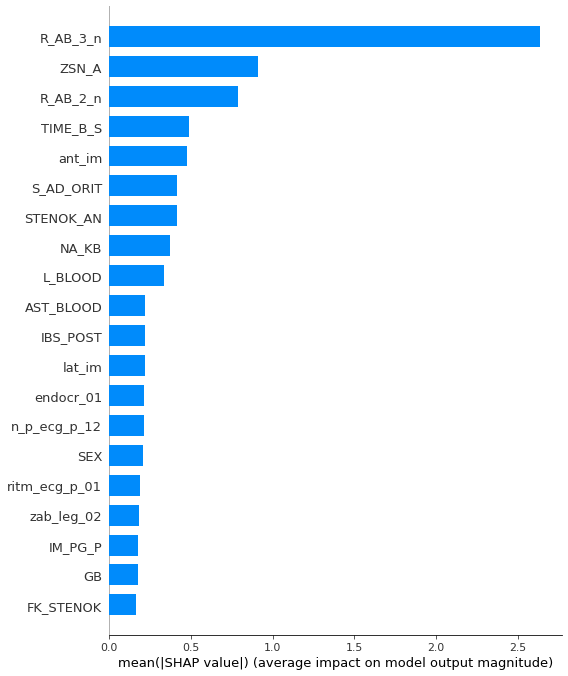

Weight,Feature
0.3695 ± 0.0875,R_AB_3_n
0.0738 ± 0.0684,ZSN_A
0.0324 ± 0.0210,ritm_ecg_p_01
0.0294 ± 0.0129,NA_KB
0.0294 ± 0.0361,STENOK_AN
0.0293 ± 0.0081,INF_ANAM
0.0230 ± 0.0117,GB
0.0228 ± 0.0214,S_AD_ORIT
0.0226 ± 0.0259,ritm_ecg_p_07
0.0210 ± 0.0242,ROE


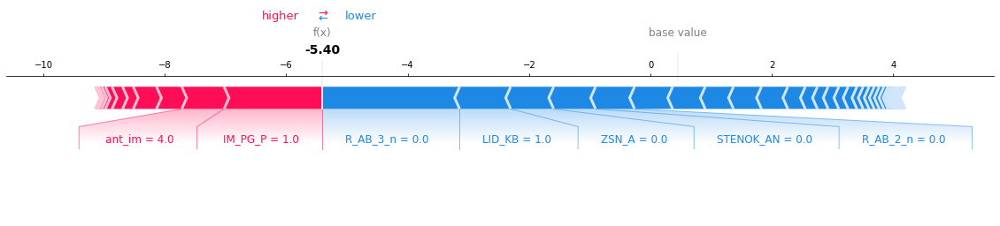

In [49]:
HGDB_classifier(df_X_no_complications, df_Y)

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.9529411764705882
Balanced Accuracy [Higher Better]: 
Training: 1.0 -- Test: 0.8540331196581197
Precision [Higher Better]: 
Training: 1.0 -- Test: 0.9736842105263158
Recall [Higher Better]: 
Training: 1.0 -- Test: 0.7115384615384616
F1-measure [Higher Better]: 
Training: 1.0 -- Test: 0.8222222222222223
Cohen Kappa [Higher Better]: 
Training: 1.0 -- Test: 0.795857099969979
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 1.0 -- Test: 0.8088659124247968
ROC AUC [Higher Better]: 
Training: 1.0 -- Test: 0.8540331196581198


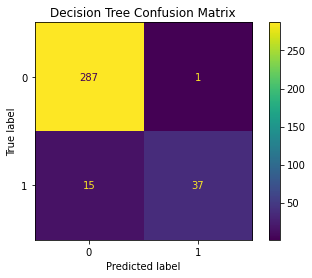

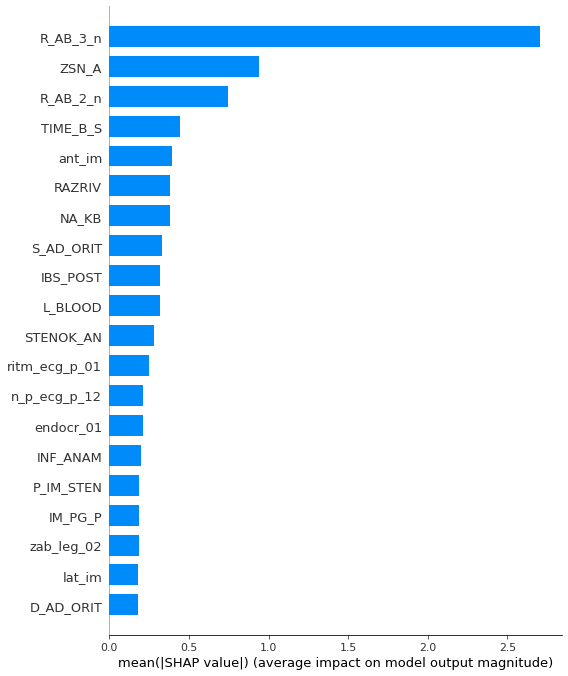

Weight,Feature
0.3464 ± 0.0123,R_AB_3_n
0.1879 ± 0.0323,RAZRIV
0.0641 ± 0.0266,ZSN_A
0.0151 ± 0.0119,STENOK_AN
0.0141 ± 0.0145,S_AD_ORIT
0.0132 ± 0.0000,REC_IM
0.0132 ± 0.0000,OTEK_LANC
0.0125 ± 0.0172,NOT_NA_KB
0.0124 ± 0.0142,n_p_ecg_p_12
0.0117 ± 0.0105,ALT_BLOOD


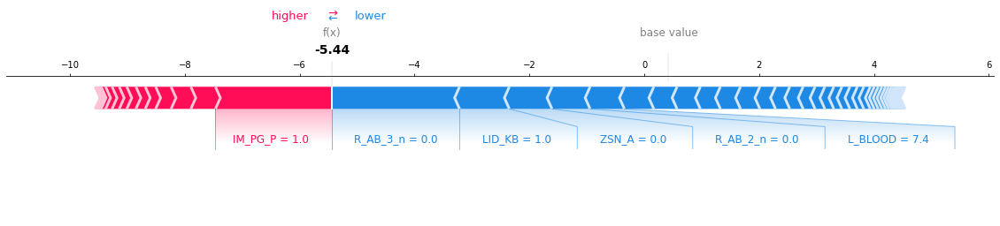

In [42]:
HGDB_classifier(df_X_full_3, df_Y)

In [43]:
top_10 = ["R_AB_3_n","RAZRIV","ZSN_A","ZSN","ritm_ecg_p_01","post_im","zab_leg_03","nr_04","n_r_ecg_p_05","R_AB_1_n","P_IM_STEN"]
top_5 = ["R_AB_3_n","RAZRIV","ZSN_A","ZSN","ritm_ecg_p_01"]
df_top_10 = df_X_full[top_10]
df_top_5 = df_X_full[top_5]


Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=7, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.8865030674846626 -- Test: 0.9529411764705882
Balanced Accuracy [Higher Better]: 
Training: 0.8865030674846626 -- Test: 0.8697916666666667
Precision [Higher Better]: 
Training: 0.9793478260869565 -- Test: 0.9285714285714286
Recall [Higher Better]: 
Training: 0.78965819456617 -- Test: 0.75
F1-measure [Higher Better]: 
Training: 0.8743328481319749 -- Test: 0.8297872340425532
Cohen Kappa [Higher Better]: 
Training: 0.7730061349693251 -- Test: 0.802841403305306
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.7879272447616799 -- Test: 0.809006952949171
ROC AUC [Higher Better]: 
Training: 0.8865030674846626 -- Test: 0.8697916666666667


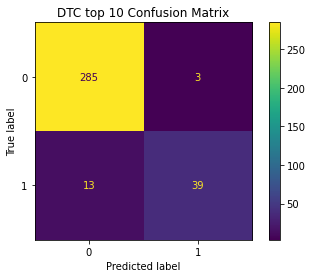

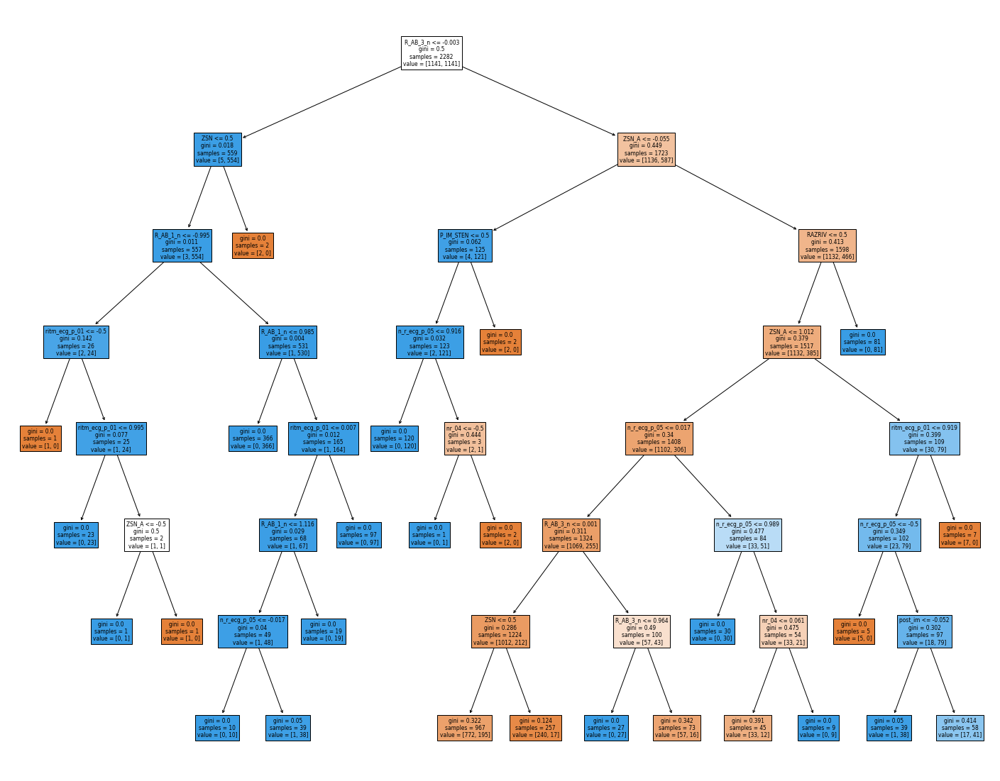

R_AB_3_n0.090 +/- 0.008
RAZRIV  0.050 +/- 0.006
ZSN_A   0.033 +/- 0.005
ZSN     0.017 +/- 0.006


Weight,Feature
0.3247 ± 0.0226,R_AB_3_n
0.1799 ± 0.0275,RAZRIV
0.1120 ± 0.0270,ZSN_A
0.0802 ± 0.0469,ZSN
0.0395 ± 0.0487,ritm_ecg_p_01
0.0050 ± 0.0123,P_IM_STEN
0 ± 0.0000,R_AB_1_n
0 ± 0.0000,zab_leg_03
0 ± 0.0000,post_im
-0.0054 ± 0.0141,nr_04


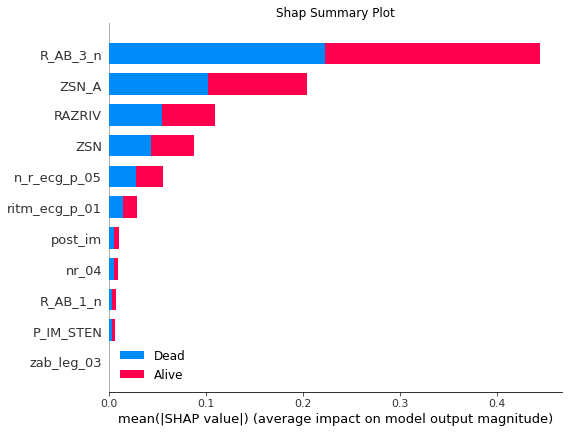

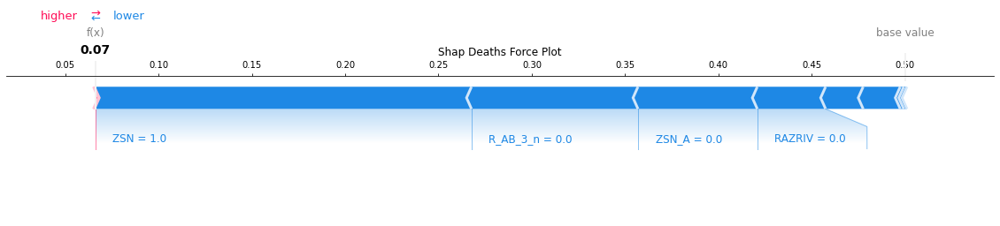

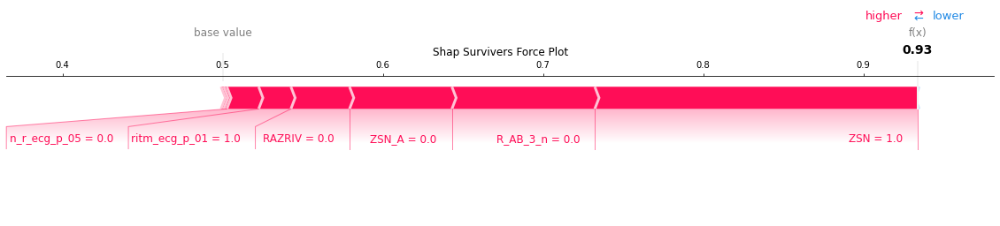

In [44]:
dtc_mixed_optimised(df_top_10, df_Y,"DTC top 10")

Fitting 10 folds for each of 21 candidates, totalling 210 fits
DecisionTreeClassifier(max_depth=6, random_state=42)
Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.8615249780893953 -- Test: 0.9588235294117647
Balanced Accuracy [Higher Better]: 
Training: 0.8615249780893952 -- Test: 0.8732638888888888
Precision [Higher Better]: 
Training: 0.9725085910652921 -- Test: 0.975
Recall [Higher Better]: 
Training: 0.7440841367221736 -- Test: 0.75
F1-measure [Higher Better]: 
Training: 0.843098311817279 -- Test: 0.8478260869565216
Cohen Kappa [Higher Better]: 
Training: 0.7230499561787905 -- Test: 0.8244837758112095
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.7438602130148864 -- Test: 0.8339754470584229
ROC AUC [Higher Better]: 
Training: 0.8615249780893952 -- Test: 0.873263888888889


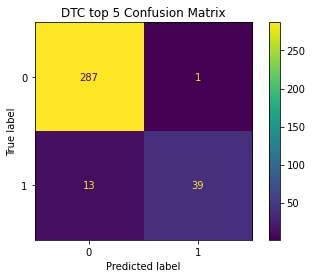

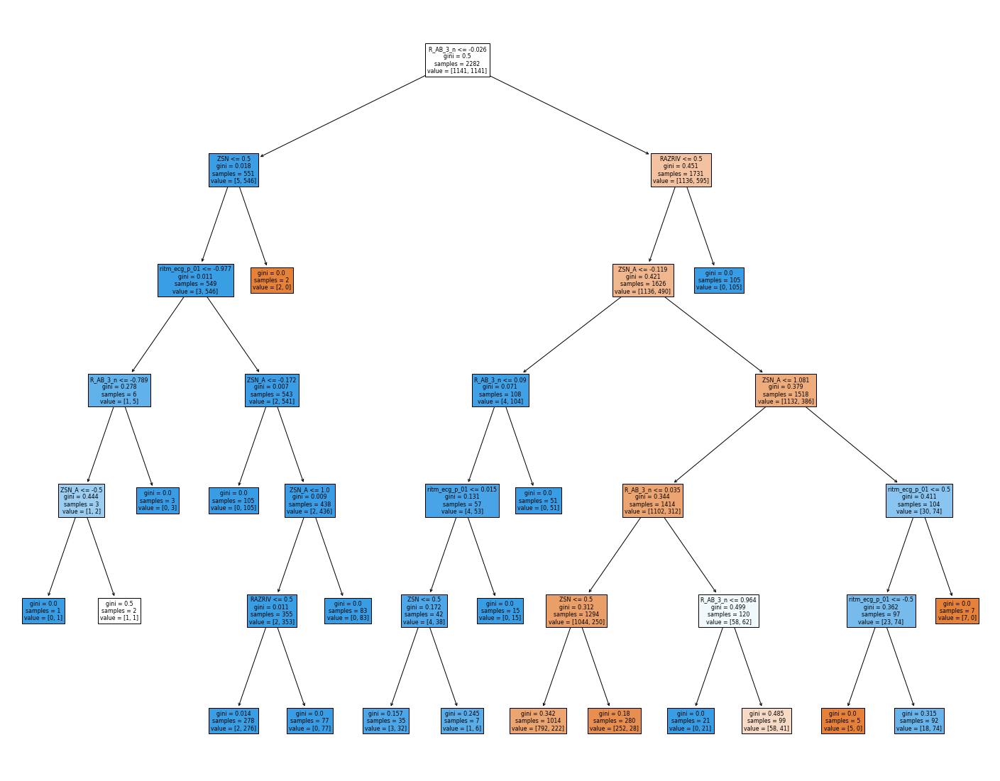

R_AB_3_n0.086 +/- 0.007
RAZRIV  0.051 +/- 0.005
ZSN_A   0.038 +/- 0.005
ZSN     0.017 +/- 0.006


Weight,Feature
0.3139 ± 0.0356,R_AB_3_n
0.1954 ± 0.0372,RAZRIV
0.1286 ± 0.0202,ZSN_A
0.0502 ± 0.0524,ZSN
0.0435 ± 0.0414,ritm_ecg_p_01


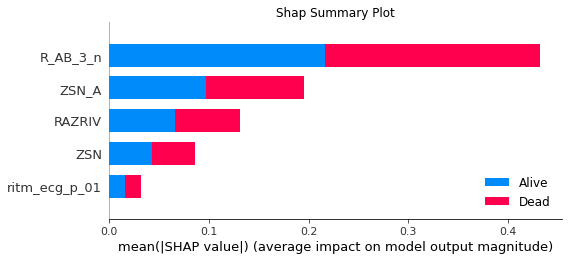

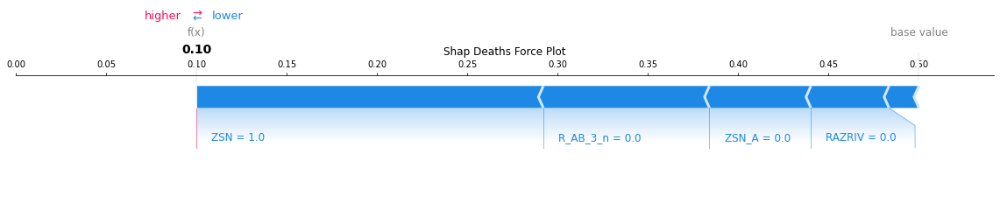

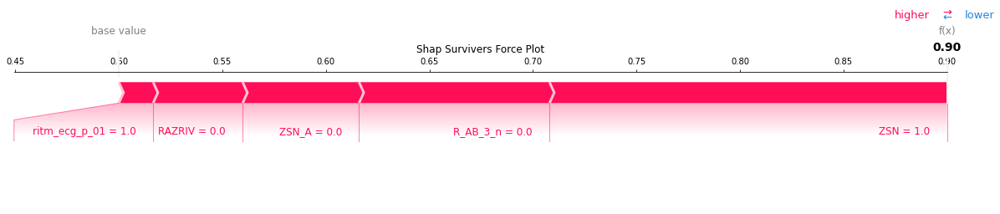

In [45]:
dtc_mixed_optimised(df_top_5, df_Y,"DTC top 5")

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.9246275197195443 -- Test: 0.9529411764705882
Balanced Accuracy [Higher Better]: 
Training: 0.9246275197195443 -- Test: 0.8540331196581197
Precision [Higher Better]: 
Training: 0.9969230769230769 -- Test: 0.9736842105263158
Recall [Higher Better]: 
Training: 0.8518843120070114 -- Test: 0.7115384615384616
F1-measure [Higher Better]: 
Training: 0.9187145557655955 -- Test: 0.8222222222222223
Cohen Kappa [Higher Better]: 
Training: 0.8492550394390885 -- Test: 0.795857099969979
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.8583880745422732 -- Test: 0.8088659124247968
ROC AUC [Higher Better]: 
Training: 0.9246275197195443 -- Test: 0.8540331196581198


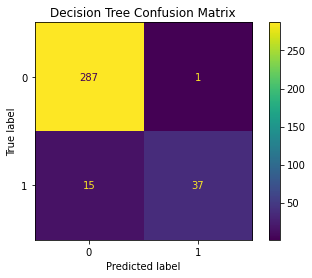

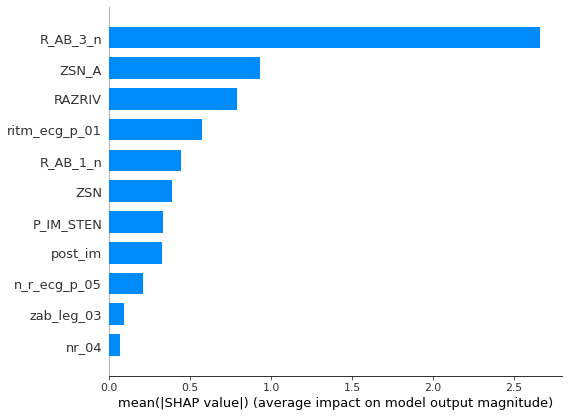

Weight,Feature
0.3694 ± 0.0348,R_AB_3_n
0.2065 ± 0.0222,RAZRIV
0.1055 ± 0.0179,ZSN_A
0.0271 ± 0.0387,ritm_ecg_p_01
0.0150 ± 0.0072,post_im
0 ± 0.0000,P_IM_STEN
0 ± 0.0000,nr_04
0 ± 0.0000,zab_leg_03
0 ± 0.0000,ZSN
-0.0019 ± 0.0137,R_AB_1_n


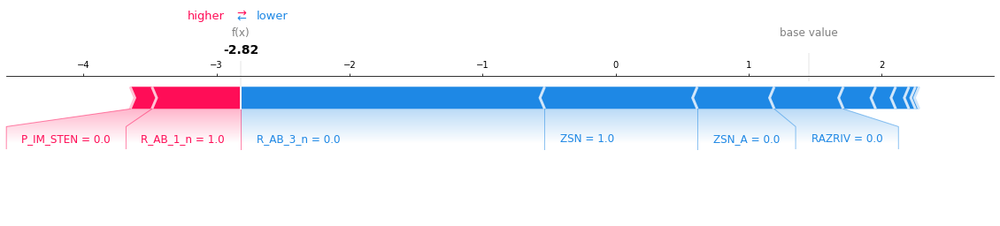

Evaluating decision tree model on training & test set.
Accuracy [Higher Better]: 
Training: 0.8689745836985101 -- Test: 0.95
Balanced Accuracy [Higher Better]: 
Training: 0.8689745836985101 -- Test: 0.8680555555555556
Precision [Higher Better]: 
Training: 0.9497863247863247 -- Test: 0.9069767441860465
Recall [Higher Better]: 
Training: 0.7791411042944786 -- Test: 0.75
F1-measure [Higher Better]: 
Training: 0.8560423688011555 -- Test: 0.8210526315789475
Cohen Kappa [Higher Better]: 
Training: 0.7379491673970202 -- Test: 0.7922955296823343
Matthews Correlation Coefficient (MCC) [Higher Better]: 
Training: 0.7501560862544241 -- Test: 0.7971294168765399
ROC AUC [Higher Better]: 
Training: 0.86897458369851 -- Test: 0.8680555555555557


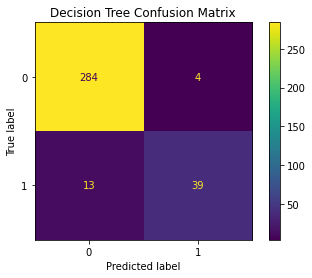

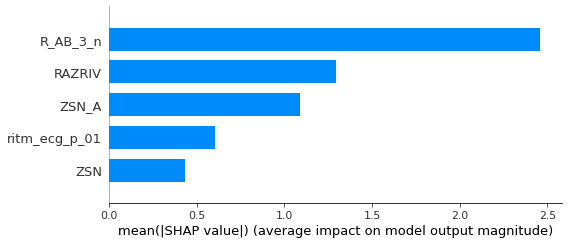

Weight,Feature
0.3314 ± 0.0383,R_AB_3_n
0.1489 ± 0.0219,RAZRIV
0.1285 ± 0.0305,ZSN_A
0.0315 ± 0.0184,ZSN
0.0192 ± 0.0323,ritm_ecg_p_01


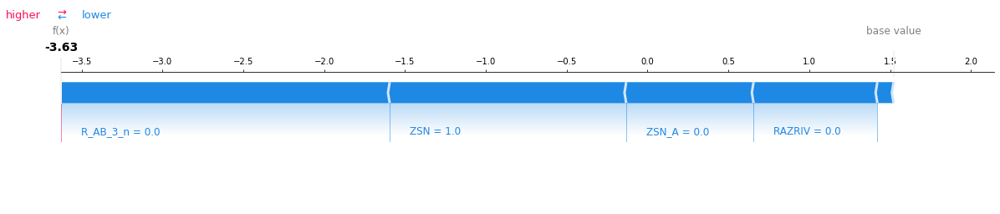

In [46]:
HGDB_classifier(df_top_10, df_Y)
HGDB_classifier(df_top_5, df_Y)